In [1]:
import pandas as pd
import numpy as np
import gffutils
import urllib.parse 

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%pwd

'/home/jee/rna_seq/bowtie2/output_sam'

In [2]:
vre0008_qlft_df = pd.read_csv('/home/jee/rna_seq/bowtie2/output_sam/vre0008_17oct2024_qlft_results.csv').rename(columns={'Unnamed: 0':'Gene'})
ent0189_qlft_df = pd.read_csv('/home/jee/rna_seq/bowtie2/output_sam/ent0189_17oct2024_qlft_results.csv').rename(columns={'Unnamed: 0':'Gene'})
ns0794_qlft_df = pd.read_csv('/home/jee/rna_seq/bowtie2/output_sam/ns0794_17oct2024_qlft_results.csv').rename(columns={'Unnamed: 0':'Gene'})

In [3]:
# Load GFF3 file into a database
vre0008_db_all = gffutils.create_db('HC_VRE0008_assembly_complete_bakta.gff3', dbfn='HC_VRE0008_assembly_complete_bakta_annotations.db', force=True, keep_order=True)
ent0189_db_all= gffutils.create_db('ent0189_full_db.gff3', dbfn='ent0189_full_db.db', force=True, keep_order=True)
ns0794_db_all = gffutils.create_db('HC_NS0794_assembly_complete_sorted_19Sep2024.gff3', dbfn='HC_NS0794_assembly_complete_sorted_19Sep2024.db', force=True, keep_order=True)

#### Functions

In [4]:
# UPDATED 
# To check if the gene names in featureCount analysis and gff3 are matching:
# db_all: the original gff3 file
# gene_ls: lits of genes with PVal>0.05; either positive or negative log2fold change

def exist_in_gff3_file(db_all, gene_ls):
    import urllib.parse  # Ensure we can handle decoding
    
    # Set to track gene names that are found
    found_genes = set()

    # Loop through the list of gene names
    for gene_name in gene_ls:
        gene_found = False  # Flag to check if the gene was found

        # Iterate through all features in the GFF3 file
        for feature in db_all.all_features():
            # Decode the 'Name' attribute to handle special characters like '%'
            if 'Name' in feature.attributes:
                decoded_names = [urllib.parse.unquote(name) for name in feature.attributes['Name']]

                # Check if the decoded name matches the gene name
                if gene_name in decoded_names:
                    found_genes.add(gene_name)  # Mark this gene name as found
                    gene_found = True  # Set the flag to True
                    print(f"Found: {gene_name}")  # Print found gene

        # If the gene was not found, print a warning
        if not gene_found:
            print(f"Warning: Gene name '{gene_name}' not found in the GFF3 file.")
    
    return found_genes


In [5]:
# To extract only specific subset of CDS/genes of certain PVal(e.g., >0.05) & log2fold(e.g., positive) from the original gff3 file
# db_all: the original gff3 file
# gene_ls: lits of genes with pval>0.05; either positive or negative log2fold change
# gff3_file_name: whatever file name of the subset gff3 that you want to save as; 
    # in a str format, i.e., 'filename' wihtout the '.gff' file format tag
    
def pval_extracted_all_features_gff3(db_all, gene_ls, gff3_file_name):    
    # Replace %2C with ',' in the gene names
    cleaned_gene_names = [name.replace('%2C', ',') for name in gene_ls]

    # Prepare a list to store the matching features
    matching_features_pval_sig = []

    # Iterate through all features in the GFF3 database
    for feature in db_all.all_features():  # Loop through all features
        # Check if the feature has a 'Name' attribute
        if 'Name' in feature.attributes:
            # Check if any of the names match the cleaned gene names
            for name in feature.attributes['Name']:
                if name in cleaned_gene_names:
                    matching_features_pval_sig.append(feature)
                    print(f"Found feature with Name: {name}, Type: {feature.featuretype}")  # Print found feature Name and Type

    # Optionally, save the matching features rows to a file
    with open(f"{gff3_file_name}.gff3", 'w') as f:
        for row in matching_features_pval_sig:
            f.write(str(row) + '\n')


#usage example:
# pval_extracted_cds_gff3(ent0189_db_all, ent0189_pval_ls, 'test')

In [6]:
# UPDATED 
# Function to extract attributes from all features in the GFF3 file
# db_extracted is created via gffutils.create_db() with the extracted gff3 file via pval_extracted_cds_gff3() function
def features_with_dbxref_or_uniref(db_extracted):
    # Prepare a list to collect the data
    data = []

    # Iterate over all features in the GFF3 database
    for feature in db_extracted.all_features():
        # Extract the 'ID' and 'Name' attributes
        feature_id = feature.attributes.get('ID', [''])[0]  # Extract the ID attribute
        name = feature.attributes.get('Name', [''])[0]  # Extract the Name attribute

        # Extract 'Dbxref' if present
        dbxref_list = feature.attributes.get('Dbxref', [])

        # Extract UniRef100, UniRef90, and UniRef50 from both Dbxref and Note attributes
        note_list = feature.attributes.get('Note', [])  # 'Note' may contain UniRef IDs

        # Combine Dbxref and Note lists for unified processing
        combined_list = dbxref_list + note_list

        uniref100_ids = [
            entry.split('_')[1] for entry in combined_list if 'UniRef100' in entry
        ]

        uniref90_ids = [
            entry.split('_')[1] for entry in combined_list if 'UniRef90' in entry
        ]

        uniref50_ids = [
            entry.split('_')[1] for entry in combined_list if 'UniRef50' in entry
        ]

        # Join extracted UniRef IDs into single strings separated by "|"
        uniref100_str = "|".join(uniref100_ids) if uniref100_ids else ''
        uniref90_str = "|".join(uniref90_ids) if uniref90_ids else ''
        uniref50_str = "|".join(uniref50_ids) if uniref50_ids else ''

        # Append the collected data as a dictionary
        data.append({
            'Feature_Type': feature.featuretype,  # Type of the feature (e.g., CDS, exon, gene)
            'Feature_ID': feature_id,
            'Name': name,
            'Dbxref': "|".join(dbxref_list) if dbxref_list else '',  # Join Dbxref entries
            'UniRef100': uniref100_str,
            'UniRef90': uniref90_str,
            'UniRef50': uniref50_str,
        })

    # Create a DataFrame from the collected data
    df = pd.DataFrame(data)

    # Replace empty strings with NaN for easier filtering
    df.replace('', np.nan, inplace=True)

    return df


In [241]:
# df = dataframe from function: features_with_dbxref_or_uniref()
# txt_file_name = file containing feature list in string (with ' ')
def df_melt(df, ls_name_in_str):
    df_melted = df.melt(id_vars=['Feature_Type','Feature_ID','Name'], value_vars=["UniRef100", "UniRef90", "UniRef50"], 
                              var_name="SourceCol", value_name="Entry")
#     df_melted[['Entry']].to_csv(f"{ls_name_in_str}_ls.txt",index=None,header=False)
    df_melted[df_melted['Entry'].notna()][['Entry']].to_csv(f"{ls_name_in_str}_ls.txt", index=None, header=False)

    return df_melted
# the text file that is returned from this function must be inputted into 'https://www.uniprot.org/id-mapping' then the tsv file is then uploaded onto this notebook 

In [ ]:
# df_idmapping_total = merged dfs of melted_df + idmapping_df 
# example: pd.merge(vre0008_up_df_melted, vre0008_upregulated_idmapping, on="Entry", how="outer")   
# isolate_name_in_str = 'vre0008' or 'ent0189' or 'ns0794'
# up_or_down_str = 'upregulated' or 'downregulated'

def filter_merged_idmapping_total(df_idmapping_total, isolate_name_in_str, up_or_down_str):
    df = df_idmapping_total[~df_idmapping_total['Protein names'].isin(['deleted',np.nan])]
   
    # Sort by 'SourceCol' to prioritize 'UniRef100' and retain the first occurrence
    df["SourcePriority"] = df["SourceCol"].apply(lambda x: 0 if x == "UniRef100" else 1)

    # Drop duplicates in the 'Name' column, keeping the row with the lowest priority (i.e., 'UniRef100')
    df_cleaned = df.sort_values(by="SourcePriority").drop_duplicates(subset="Name", keep="first")

    # Drop the helper column (optional)
    df_cleaned = df_cleaned.drop(columns=["SourcePriority"])

    # Save the cleaned DataFrame
    df_cleaned.to_csv(f'{isolate_name_in_str}_{up_or_down_str}_GO_28Dec2024.tsv', sep='\t', index=None )
    
    return df_cleaned

__Workflow with the above functions:__<br>
1. Make lists of up and downregulated genes (anything over 1 logFC, which is 2 fold change, and -1 logFC)
2. Use the three functions: 
    * __exist_in_gff3_file()__; double confirming that the differentially expressed genes are present in the gff3 files (_it should! if not, something is very wrong_) 
    * __pval_extracted_all_features_gff3()__; which returns and saves the gff3 files only containing up or downregulated gene info
    * __features_with_dbxref_or_uniref()__; requires a new gff3 db created from filtered gff3 file that only contains either up or downregulated genes
        * save as a new_df = features_with_dbxref_or_uniref()
3. Use the function __df_melt()__ to melt the new_df containing 'UniRef100','UniRef90','UniRef50' into one column then the columns is saved into a txt file then ran through https://www.uniprot.org/id-mapping
4. Save the idmapping results as tsv then load ({} means regex):  
    * __{}_upregulated_idmapping = pd.read_csv('{}_up_uniref_idmapping_28Dec2024.tsv', sep='\t')__  
    * __{}_downregulated_idmapping = pd.read_csv('{}_down_uniref_idmapping_28Dec2024.tsv', sep='\t')__ <br>
5. Merge the melted df and the idmapping results from uniprot.org:
    * __{}_upregulated_idmapping_total = pd.merge({}_up_df_melted, {}_upregulated_idmapping, on="Entry", how="outer")__ 
    * __{}_downregulated_idmapping_total = pd.merge({}_down_df_melted, {}_downregulated_idmapping, on="Entry", how="outer")__ <br> 
6. The merged dfs (i.e.,*\_idmapping_total) with __filter_merged_idmapping_total()__ function saves the final dataframe with dropped rows that contain 'deleted' or np.nan as cell values under ['Protein names']. Duplicated rows are also dropped while prioritizing 'UniRef100' content.
7. The saved df, '\*_\*_GO_28Dec2024.tsv', must be manually checked for the empty columns and whether the empty GO content can be filled with either 'UniRef90' (orange rows in excel sheet) or 'UniRef50' (pink rows in excel sheet) content instead. If red, that means none of the UniRef (100, 90, or 50) had associated GO.

In [250]:
def process_part1(db_all, gene_list, prefix, regulation_type, output_name_suffix):
    """
    Part 1: Process data up to generating the melted DataFrame.

    Parameters:
    - db_all: gffutils database object.
    - gene_list: List of genes to process.
    - prefix: Prefix string, e.g., 'ent0189'.
    - regulation_type: Regulation type string, e.g., 'upregulated'.
    - output_name_suffix: Suffix for filenames, e.g., '28Dec2024'.

    Returns:
    - File path of the melted DataFrame.
    """
    # Generate dynamic filenames
    gff3_output = f"{prefix}_{regulation_type}_{output_name_suffix}.gff3"
    db_output = f"{prefix}_{regulation_type}_{output_name_suffix}.db"
    melted_output = f"{prefix}_{regulation_type}_uniref"

    # Step 1: Extract features and create GFF3 file
    exist_in_gff3_file(db_all, gene_list)
    pval_extracted_all_features_gff3(db_all, gene_list, f"{prefix}_{regulation_type}_{output_name_suffix}")

    # Step 2: Create a gffutils database from the GFF3 file
    db_processed = gffutils.create_db(gff3_output, dbfn=db_output, force=True, keep_order=True)

    # Step 3: Extract features with Dbxref or UniRef
    df_extracted = features_with_dbxref_or_uniref(db_processed)

    # Step 4: Melt the DataFrame for further analysis and save it
    df_melted = df_melt(df_extracted, melted_output)

    # Save melted DataFrame to a CSV file for Part 2
    melted_file = f"{melted_output}_melted.csv"
    df_melted.to_csv(melted_file, index=False)

    return melted_file

# Example usage of Part 1
melted_file_path = process_part1(
    db_all=ent0189_db_all,
    gene_list=ent0189_up_ls,
    prefix="ent0189",
    regulation_type="upregulated",
    output_name_suffix="28Dec2024"
)
print(f"Melted file saved at: {melted_file_path}")


Found: NAD(P)-dependent dehydrogenase
Found: tetracycline efflux MFS transporter Tet(L)
Found: tetracycline resistance ribosomal protection protein Tet(M)
Found: beta-galactosidase
Found: beta-galactosidase
Found: beta-galactosidase
Found: Glycosyltransferase family 8 protein
Found: Alpha/beta hydrolase fold protein
Found: Cell wall surface anchor protein
Found: Magnesium transporter
Found: L-lactate oxidase
Found: L-lactate oxidase
Found: NADH peroxidase
Found: General stress protein A
Found: HAD family phosphatase
Found: HAD family phosphatase
Found: DUF2273 domain-containing protein
Found: DUF2273 domain-containing protein
Found: LPXTG-domain-containing protein cell wall anchor domain
Found: Heat-shock protein Hsp20
Found: pyruvate oxidase
Found: alkaline shock response membrane anchor protein AmaP
Found: alkaline shock response membrane anchor protein AmaP
Found: Poly-beta-1,6-N-acetyl-D-glucosamine synthase
Found: mannitol-1-phosphate 5-dehydrogenase
Found: 50S ribosomal protein L

In [251]:
def process_part2(melted_file, idmapping_file, prefix, regulation_type):
    """
    Part 2: Merge melted DataFrame with ID mapping file and filter results.

    Parameters:
    - melted_file: Path to the melted DataFrame from Part 1.
    - idmapping_file: Path to the ID mapping file (from external software).
    - prefix: Prefix string, e.g., 'ent0189'.
    - regulation_type: Regulation type string, e.g., 'upregulated'.

    Returns:
    - Final filtered DataFrame with GO terms.
    """
    # Step 1: Load the melted DataFrame
    df_melted = pd.read_csv(melted_file)

    # Step 2: Load the ID mapping file
    idmapping = pd.read_csv(idmapping_file, sep='\t')

    # Step 3: Merge the melted DataFrame with the ID mapping file
    merged_df = pd.merge(df_melted, idmapping, on="Entry", how="outer")

    # Step 4: Filter the merged DataFrame and save the final result
    final_go_df = filter_merged_idmapping_total(merged_df, prefix, regulation_type)

    return final_go_df

# Example usage of Part 2
idmapping_file_path = "ent0189_upregulated_uniref_idmapping_28Dec2024.tsv"
final_go_df = process_part2(
    melted_file='ent0189_upregulated_uniref_melted.csv',
    idmapping_file=idmapping_file_path,
    prefix="ent0189",
    regulation_type="upregulated"
)


/home/jee/conda/envs/ml_prediction/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


---

#### VRE0008

In [ ]:
vre0008_qlft_df.sort_values(by='logFC', ascending=False)
vre0008_up_ls = vre0008_qlft_df[(vre0008_qlft_df['logFC']>=1) & (vre0008_qlft_df['FDR']<=0.05)]['Gene'].to_list() # legnth = 50
vre0008_down_ls = vre0008_qlft_df[(vre0008_qlft_df['logFC']<=-1) & (vre0008_qlft_df['FDR']<=0.05)]['Gene'].to_list() 

In [ ]:
exist_in_gff3_file(vre_0008_db_all,vre0008_up_ls)
pval_extracted_all_features_gff3(vre_0008_db_all,vre0008_up_ls,'vre0008_upregulated_27Dec2024')
vre_0008_db_upregulated = gffutils.create_db('vre0008_upregulated_27Dec2024.gff3', dbfn='vre0008_upregulated_27Dec2024.db', force=True, keep_order=True)
vre0008_up_df = features_with_dbxref_or_uniref(vre_0008_db_upregulated)
vre0008_up_df

In [ ]:
vre0008_up_df_melted = vre0008_up_df.melt(id_vars=['Feature_Type','Feature_ID','Name'], value_vars=["UniRef100", "UniRef90", "UniRef50"], 
                              var_name="SourceCol", value_name="Entry")
vre0008_up_df_melted[['Entry']].to_csv('vre0008_up_uniref_ls.txt',index=None,header=False)

In [ ]:
vre0008_upregulated_idmapping = pd.read_csv('vre0008_up_uniref_idmapping_27Dec2024.tsv', sep='\t')
vre0008_upregulated_idmapping

In [ ]:
vre0008_upregulated_idmapping_total = pd.merge(vre0008_up_df_melted, vre0008_upregulated_idmapping, on="Entry", how="outer") 
vre0008_upregulated_idmapping_total[vre0008_upregulated_idmapping_total['Feature_ID']=='ICHPGC_00555']

In [ ]:
df = vre0008_upregulated_idmapping_total[~vre0008_upregulated_idmapping_total['Protein names'].isin(['deleted',np.nan])]

In [ ]:
# Sort by 'SourceCol' to prioritize 'UniRef100' and retain the first occurrence
df["SourcePriority"] = df["SourceCol"].apply(lambda x: 0 if x == "UniRef100" else 1)

# Drop duplicates in the 'Name' column, keeping the row with the lowest priority (i.e., 'UniRef100')
df_cleaned = df.sort_values(by="SourcePriority").drop_duplicates(subset="Name", keep="first")

# Drop the helper column (optional)
df_cleaned = df_cleaned.drop(columns=["SourcePriority"])

# Display the cleaned DataFrame
display(df_cleaned) # shape (49, 17)
# df_cleaned.to_csv('vre0008_upregulated_GO_28Dec2024.tsv', sep='\t', index=None )

In [462]:
display(vre0008_up_df_melted[vre0008_up_df_melted['Name']=='Manganese catalase family protein'])
# display(vre0008_up_df_melted[vre0008_up_df_melted['Name'].str.contains('Lytic polysaccharide monooxygenase',case=None,na=None)])
# # display(vre0008_up_df[vre0008_up_df['Name'].str.contains('Abortive phage resistance protein',case=None,na=None)])
# # # vre0008_upregulated_idmapping[vre0008_upregulated_idmapping['Protein names']=='Chitin-binding protein']
vre0008_upregulated_idmapping[vre0008_upregulated_idmapping['Entry']=='A0A2U2P6A0']

,Feature_Type,Feature_ID,Name,SourceCol,Entry
27,CDS,ICHPGC_10810,Manganese catalase family protein,UniRef100,A0A7U8FTN6
79,CDS,ICHPGC_10810,Manganese catalase family protein,UniRef90,A0A2U2P6A0
131,CDS,ICHPGC_10810,Manganese catalase family protein,UniRef50,A0A8J3YJF8


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
67,A0A2U2P6A0,A0A2U2P6A0,unreviewed,A0A2U2P6A0_ENTHR,Manganese catalase family protein (Manganese c...,ydbD EB10_01807 NCTC12204_02304 QBL76_10520,Enterococcus hirae,276.0,NaN,catalase activity [GO:0004096],GO:0004096,catalase activity [GO:0004096],NaN


In [458]:
display(vre0008_up_df_melted[vre0008_up_df_melted['Entry']=='A0A133CN96'])
display(vre0008_up_df_melted[vre0008_up_df_melted['Name'].str.contains('Abortive phage resistance protein',case=None,na=None)])
display(vre0008_up_df[vre0008_up_df['Name'].str.contains('Abortive phage resistance protein',case=None,na=None)])
# vre0008_upregulated_idmapping[vre0008_upregulated_idmapping['Protein names']=='Chitin-binding protein']
vre0008_upregulated_idmapping[vre0008_upregulated_idmapping['Entry']=='A0A133CN96']

,Feature_Type,Feature_ID,Name,SourceCol,Entry
53,CDS,ICHPGC_00555,Abortive phage resistance protein AbiGi (Putat...,UniRef90,A0A133CN96


,Feature_Type,Feature_ID,Name,SourceCol,Entry
1,CDS,ICHPGC_00555,Abortive phage resistance protein AbiGi (Putat...,UniRef100,C9BY54
53,CDS,ICHPGC_00555,Abortive phage resistance protein AbiGi (Putat...,UniRef90,A0A133CN96
105,CDS,ICHPGC_00555,Abortive phage resistance protein AbiGi (Putat...,UniRef50,V5XQ13


,Feature_Type,Feature_ID,Name,Dbxref,UniRef100,UniRef90,UniRef50
1,CDS,ICHPGC_00555,Abortive phage resistance protein AbiGi (Putat...,NaN,C9BY54,A0A133CN96,V5XQ13


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
52,A0A133CN96,A0A133CN96,unreviewed,A0A133CN96_ENTFC,Uncharacterized protein,AWT83_11250 B1P95_09985 GBM44_08200 GBM73_0139...,Enterococcus faecium (Streptococcus faecium),442.0,NaN,NaN,NaN,NaN,NaN


---

In [ ]:
exist_in_gff3_file(vre0008_db_all, vre0008_down_ls)
pval_extracted_all_features_gff3(vre0008_db_all, vre0008_down_ls, 'vre0008_downregulated_28Dec2024')
vre0008_db_downregulated = gffutils.create_db('vre0008_downregulated_28Dec2024.gff3', dbfn='vre0008_downregulated_28Dec2024.db', force=True, keep_order=True)
vre0008_down_df = features_with_dbxref_or_uniref(vre0008_db_downregulated)
vre0008_down_df_melted = df_melt(vre0008_down_df, 'vre0008_down_uniref')


In [ ]:
vre0008_downregulated_idmapping = pd.read_csv('vre0008_down_uniref_idmapping_28Dec2024.tsv', sep='\t')
vre0008_downregulated_idmapping_total = pd.merge(vre0008_down_df_melted, vre0008_downregulated_idmapping, on="Entry", how="outer") 
vre0008_downregulated_final_GO = filter_merged_idmapping_total(vre0008_downregulated_idmapping_total, 'vre0008', 'downregulated')

In [301]:
vre0008_downregulated_final_GO[vre0008_downregulated_final_GO['Entry']=='A0A1A7SVZ4']
vre0008_down_df_melted[vre0008_down_df_melted['Entry']=='A0A1A7SVZ4']
display(vre0008_down_df[vre0008_down_df['Name']=='Endolytic transglycosylase MltG'])

vre0008_downregulated_idmapping[vre0008_downregulated_idmapping['Entry']=='A0A1A7SVZ4']

,Feature_Type,Feature_ID,Name,Dbxref,UniRef100,UniRef90,UniRef50
6,CDS,ICHPGC_06500,Endolytic transglycosylase MltG,NaN,NaN,UPI0015DD9BFF,A0A1A7SVZ4


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
58,A0A1A7SVZ4,A0A1A7SVZ4,unreviewed,A0A1A7SVZ4_ENTFC,Uncharacterized protein,A5804_000951 B1P95_06335 EB12_00436,Enterococcus faecium (Streptococcus faecium),54.0,NaN,NaN,NaN,NaN,NaN


In [597]:
# To edit the missing GO content for the upregulated and downregulated GO files from 28Dec2024
vre0008_upregulated_GO_28Dec2024 = pd.read_csv('vre0008_upregulated_GO_28Dec2024.tsv', sep='\t')
vre0008_downregulated_GO_28Dec2024 = pd.read_csv('vre0008_downregulated_GO_28Dec2024.tsv', sep='\t')

,Feature_Type,Feature_ID,Name,SourceCol,Entry
0,CDS,ICHPGC_00330,Glucose uptake protein GlcU,UniRef100,A0A132P9I3
1,CDS,ICHPGC_00555,Abortive phage resistance protein AbiGi (Putat...,UniRef100,C9BY54
2,CDS,ICHPGC_00655,Alpha-galactosidase,UniRef100,A0A828QG48
3,CDS,ICHPGC_00815,Ser/Thr phosphatase family protein,UniRef100,A0A1S9MJJ5
4,CDS,ICHPGC_01200,Glycosyltransferase family 8 protein,UniRef100,A0A132Z6Q5
...,...,...,...,...,...
151,CDS,ICHPGC_14185,"Kinase, PfkB family",UniRef50,A0A1L8R6U1
152,CDS,ICHPGC_14190,UbiC transcription regulator-associated domain...,UniRef50,S0KLK4
153,CDS,ICHPGC_14195,Amidohydro-3 domain-containing protein,UniRef50,A0A1L8R6Q4
154,CDS,ICHPGC_14205,C4-dicarboxylate ABC transporter,UniRef50,S1P2U7


In [604]:
# Implement this to substitute to other uniref that may have more GO content
vre0008_up_df_melted
vre0008_upregulated_idmapping = pd.read_csv('vre0008_up_uniref_idmapping_27Dec2024.tsv', sep='\t')
# ent0189_up_melted = pd.read_csv('ent0189_upregulated_uniref_melted.csv')
# ent0189_upregulated_uniref_idmapping_28Dec2024 = pd.read_csv('ent0189_upregulated_uniref_idmapping_28Dec2024.tsv', sep='\t')


vre0008_up_isna_name_list = df_cleaned[df_cleaned['Gene Ontology (GO)'].isna()].Name.to_list()
vre0008_up_isna_name_list

# Initialize an empty DataFrame to store results
vre0008_up_compiled_df = pd.DataFrame()

# Loop through the entries and filter rows
for i in vre0008_up_df_melted[vre0008_up_df_melted['Name'].isin(vre0008_up_isna_name_list)].Entry:
    # Filter the rows
    filtered_rows = vre0008_upregulated_idmapping[vre0008_upregulated_idmapping['Entry'] == f'{i}']
    
    # Append the filtered rows to the compiled DataFrame
    vre0008_up_compiled_df = pd.concat([vre0008_up_compiled_df, filtered_rows], ignore_index=True)

# Display the compiled DataFrame
display(vre0008_up_compiled_df)
vre0008_up_compiled_df[~vre0008_up_compiled_df['Gene Ontology (GO)'].isna()] # to only select for featuers with GO terms

,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
0,C9BY54,C9BY54,NaN,C9BY54_ENTFC,deleted,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,A0A132Z588,A0A132Z588,unreviewed,A0A132Z588_ENTFC,DUF2382 domain-containing protein,GBM44_07135 GBM73_02700 JCP85_06770,Enterococcus faecium (Streptococcus faecium),328.0,NaN,NaN,NaN,NaN,NaN
2,A0A132YZQ5,A0A132YZQ5,unreviewed,A0A132YZQ5_ENTFC,Uncharacterized protein,A5804_001490 B1P95_08560 CUN04_14015 EB12_0104...,Enterococcus faecium (Streptococcus faecium),106.0,NaN,NaN,NaN,NaN,NaN
3,A0A132P2R4,A0A132P2R4,unreviewed,A0A132P2R4_ENTFC,UPF0302 protein AL021_13445,A5804_001637 AWT83_13910 CQR37_02390 CUN04_004...,Enterococcus faecium (Streptococcus faecium),193.0,NaN,NaN,NaN,NaN,NaN
4,A0A133N659,A0A133N659,unreviewed,A0A133N659_ENTFC,Chitin-binding protein,B1P95_12380,Enterococcus faecium (Streptococcus faecium),202.0,NaN,NaN,NaN,NaN,NaN
5,A0A132Z541,A0A132Z541,unreviewed,A0A132Z541_ENTFC,DUF5626 domain-containing protein,A5804_000138 AWT83_03080 CQR37_10620 FIU59_08815,Enterococcus faecium (Streptococcus faecium),179.0,NaN,NaN,NaN,NaN,NaN
6,A0A7U8FTN6,A0A7U8FTN6,NaN,A0A7U8FTN6_ENTFC,deleted,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,A0A132ZGK5,A0A132ZGK5,unreviewed,A0A132ZGK5_ENTFC,Conjugal transfer protein TraE,GBM73_14505,Enterococcus faecium (Streptococcus faecium),110.0,NaN,NaN,NaN,NaN,NaN
8,A0A133CN96,A0A133CN96,unreviewed,A0A133CN96_ENTFC,Uncharacterized protein,AWT83_11250 B1P95_09985 GBM44_08200 GBM73_0139...,Enterococcus faecium (Streptococcus faecium),442.0,NaN,NaN,NaN,NaN,NaN
9,R2M9P4,R2M9P4,unreviewed,R2M9P4_ENTFC,DUF2382 domain-containing protein,UA3_01492,Enterococcus faecium EnGen0263,328.0,NaN,NaN,NaN,NaN,NaN


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
14,A0A2U2P6A0,A0A2U2P6A0,unreviewed,A0A2U2P6A0_ENTHR,Manganese catalase family protein (Manganese c...,ydbD EB10_01807 NCTC12204_02304 QBL76_10520,Enterococcus hirae,276.0,NaN,catalase activity [GO:0004096],GO:0004096,catalase activity [GO:0004096],NaN
20,Q838S1,Q838S1,reviewed,LCHMO_ENTFA,Lytic chitin monooxygenase (EC 1.14.99.53) (Ef...,EF_0362,Enterococcus faecalis (strain ATCC 700802 / V583),194.0,chitin catabolic process [GO:0006032]; polysac...,extracellular region [GO:0005576]; chitin bind...,GO:0000272; GO:0004497; GO:0005507; GO:0005576...,chitin binding [GO:0008061]; copper ion bindin...,extracellular region [GO:0005576]


In [607]:
vre0008_up_substitute_uniref_df = vre0008_up_df_melted[vre0008_up_df_melted['Entry'].isin(vre0008_up_compiled_df[~vre0008_up_compiled_df['Gene Ontology (GO)'].isna()]['From'])]
display(vre0008_up_substitute_uniref_df)
vre0008_up_compiled_df[~vre0008_up_compiled_df['Gene Ontology (GO)'].isna()]

,Feature_Type,Feature_ID,Name,SourceCol,Entry
79,CDS,ICHPGC_10810,Manganese catalase family protein,UniRef90,A0A2U2P6A0
116,CDS,ICHPGC_03895,Lytic polysaccharide monooxygenase,UniRef50,Q838S1


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
14,A0A2U2P6A0,A0A2U2P6A0,unreviewed,A0A2U2P6A0_ENTHR,Manganese catalase family protein (Manganese c...,ydbD EB10_01807 NCTC12204_02304 QBL76_10520,Enterococcus hirae,276.0,NaN,catalase activity [GO:0004096],GO:0004096,catalase activity [GO:0004096],NaN
20,Q838S1,Q838S1,reviewed,LCHMO_ENTFA,Lytic chitin monooxygenase (EC 1.14.99.53) (Ef...,EF_0362,Enterococcus faecalis (strain ATCC 700802 / V583),194.0,chitin catabolic process [GO:0006032]; polysac...,extracellular region [GO:0005576]; chitin bind...,GO:0000272; GO:0004497; GO:0005507; GO:0005576...,chitin binding [GO:0008061]; copper ion bindin...,extracellular region [GO:0005576]


In [627]:
vre0008_up_substitute_go_df = pd.merge(vre0008_up_substitute_uniref_df, vre0008_up_compiled_df[~vre0008_up_compiled_df['Gene Ontology (GO)'].isna()], on='Entry')
# vre0008_up_substitute_go_df.to_csv('vre0008_upregulated_missing_GO_28Dec2024.tsv', sep='\t', index=None)

vre0008_up_substitute_go_df_final = pd.concat([df_cleaned, vre0008_up_substitute_go_df])

vre0008_up_substitute_go_df_final.drop_duplicates(subset='Name',keep='last')[vre0008_up_substitute_go_df_final.drop_duplicates(subset='Name',keep='last')['Name']=='Manganese catalase family protein']
vre0008_up_substitute_go_df_final.drop_duplicates(subset='Name',keep='last').to_csv('vre0008_upregulated_GO_final_29Dec2024.tsv', index=None, sep='\t')


In [816]:
vre0008_up_substitute_go_df_final

,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
0,CDS,ICHPGC_00330,Glucose uptake protein GlcU,UniRef100,A0A132P9I3,A0A132P9I3,unreviewed,A0A132P9I3_ENTFC,Sugar transporter (Glucose uptake protein),A5804_001113 AWT83_11020 B1P95_08720 CI258_000...,Enterococcus faecium (Streptococcus faecium),283.0,NaN,plasma membrane [GO:0005886]; carbohydrate tra...,GO:0005886; GO:0015144,carbohydrate transmembrane transporter activit...,plasma membrane [GO:0005886]
34,CDS,ICHPGC_08350,pyruvate oxidase,UniRef100,A0A133CL37,A0A133CL37,unreviewed,A0A133CL37_ENTFC,Pyruvate oxidase (EC 1.2.3.3),spxB B1P95_11215 D9Z05_00090 GBM44_00085 GBM73...,Enterococcus faecium (Streptococcus faecium),576.0,NaN,magnesium ion binding [GO:0000287]; pyruvate o...,GO:0000287; GO:0030976; GO:0047112,magnesium ion binding [GO:0000287]; pyruvate o...,NaN
36,CDS,ICHPGC_09490,Mini-ribonuclease 3,UniRef100,A0A133CQD2,A0A133CQD2,unreviewed,A0A133CQD2_ENTFC,Mini-ribonuclease 3 (Mini-3) (Mini-RNase 3) (E...,mrnC A5804_002647 A5810_001915 AWT83_04385 B1P...,Enterococcus faecium (Streptococcus faecium),131.0,rRNA processing [GO:0006364],cytoplasm [GO:0005737]; ribonuclease III activ...,GO:0004525; GO:0005737; GO:0006364; GO:0019843,ribonuclease III activity [GO:0004525]; rRNA b...,cytoplasm [GO:0005737]
39,CDS,ICHPGC_10615,C4-dicarboxylate ABC transporter,UniRef100,A0A132Z473,A0A132Z473,unreviewed,A0A132Z473_ENTFC,C4-dicarboxylate ABC transporter (Exfoliative ...,A5804_000568 AWT83_07375 B1P95_02170 CI258_004...,Enterococcus faecium (Streptococcus faecium),321.0,NaN,plasma membrane [GO:0005886]; monoatomic catio...,GO:0005886; GO:0046583,monoatomic cation efflux transmembrane transpo...,plasma membrane [GO:0005886]
42,CDS,ICHPGC_11005,NADH peroxidase,UniRef100,A0A132Z6F6,A0A132Z6F6,unreviewed,A0A132Z6F6_ENTFC,FAD-dependent oxidoreductase (NAD(FAD)-depende...,A5804_000492 AWT83_07015 B1P95_01130 CQR37_125...,Enterococcus faecium (Streptococcus faecium),459.0,NaN,NADH peroxidase activity [GO:0016692],GO:0016692,NADH peroxidase activity [GO:0016692],NaN
43,CDS,ICHPGC_11025,aspartate-semialdehyde dehydrogenase,UniRef100,A0A132P7C3,A0A132P7C3,unreviewed,A0A132P7C3_ENTFC,Aspartate-semialdehyde dehydrogenase (ASA dehy...,asd AWT83_06995 B1P95_01150 CUN04_09265 EB12_0...,Enterococcus faecium (Streptococcus faecium),333.0,'de novo' L-methionine biosynthetic process [G...,aspartate-semialdehyde dehydrogenase activity ...,GO:0004073; GO:0009088; GO:0009089; GO:0009097...,aspartate-semialdehyde dehydrogenase activity ...,NaN
45,CDS,ICHPGC_11030,"2,3,4,5-tetrahydropyridine-2,6-dicarboxylate N...",UniRef100,A0A133CDF9,A0A133CDF9,unreviewed,A0A133CDF9_ENTFC,"2,3,4,5-tetrahydropyridine-2,6-dicarboxylate N...",dapD B1P95_01155 CUN04_09260 GBM44_02275 GBM73...,Enterococcus faecium (Streptococcus faecium),231.0,diaminopimelate biosynthetic process [GO:00198...,tetrahydrodipicolinate N-acetyltransferase act...,GO:0009089; GO:0019877; GO:0047200,tetrahydrodipicolinate N-acetyltransferase act...,NaN
46,CDS,ICHPGC_11035,4-hydroxy-tetrahydrodipicolinate reductase,UniRef100,A0A132Z6G7,A0A132Z6G7,unreviewed,A0A132Z6G7_ENTFC,4-hydroxy-tetrahydrodipicolinate reductase (HT...,dapB B1P95_01160 CUN04_09255 GBM44_02270 GBM73...,Enterococcus faecium (Streptococcus faecium),238.0,diaminopimelate biosynthetic process [GO:00198...,cytosol [GO:0005829]; 4-hydroxy-tetrahydrodipi...,GO:0005829; GO:0008839; GO:0009089; GO:0016726...,4-hydroxy-tetrahydrodipicolinate reductase [GO...,cytosol [GO:0005829]
48,CDS,ICHPGC_11040,4-hydroxy-tetrahydrodipicolinate synthase,UniRef100,A0A1S8JUB8,A0A1S8JUB8,unreviewed,A0A1S8JUB8_ENTFC,4-hydroxy-tetrahydrodipicolinate synthase (HTP...,dapA B1P95_01165,Enterococcus faecium (Streptococcus faecium),302.0,diaminopimelate biosynthetic process [GO:00198...,cytosol [GO:0005829]; 4-h

---

#### Ent0189

In [ ]:
ent0189_qlft_df.sort_values(by='logFC', ascending=False)
ent0189_up_ls = ent0189_qlft_df[(ent0189_qlft_df['logFC']>=1) & (ent0189_qlft_df['FDR']<=0.05)]['Gene'].to_list() # legnth = 326 
ent0189_down_ls = ent0189_qlft_df[(ent0189_qlft_df['logFC']<=-1) & (ent0189_qlft_df['FDR']<=0.05)]['Gene'].to_list() # length = 281 

In [ ]:
melted_file_path = process_part1(
    db_all=ent0189_db_all,
    gene_list=ent0189_up_ls,
    prefix="ent0189",
    regulation_type="upregulated",
    output_name_suffix="28Dec2024"
)
print(f"Melted file saved at: {melted_file_path}")

In [ ]:
idmapping_file_path = "ent0189_upregulated_uniref_idmapping_28Dec2024.tsv"
final_go_df = process_part2(
    melted_file='ent0189_upregulated_uniref_melted.csv',
    idmapping_file=idmapping_file_path,
    prefix="ent0189",
    regulation_type="upregulated"
) # shape (286, 17)

In [628]:
# Stopped here on Dec 28, 2024 @ 11:53pm; implement this to substitute to other uniref that may have more GO content

ent0189_up_melted = pd.read_csv('ent0189_upregulated_uniref_melted.csv')
ent0189_upregulated_uniref_idmapping_28Dec2024 = pd.read_csv('ent0189_upregulated_uniref_idmapping_28Dec2024.tsv', sep='\t')


isna_name_list = final_go_df[final_go_df['Gene Ontology (GO)'].isna()].Name.to_list()

# Initialize an empty DataFrame to store results
compiled_df = pd.DataFrame()

# Loop through the entries and filter rows
for i in ent0189_up_melted[ent0189_up_melted['Name'].isin(isna_name_list)].Entry:
    # Filter the rows
    filtered_rows = ent0189_upregulated_uniref_idmapping_28Dec2024[ent0189_upregulated_uniref_idmapping_28Dec2024['Entry'] == f'{i}']
    
    # Append the filtered rows to the compiled DataFrame
    compiled_df = pd.concat([compiled_df, filtered_rows], ignore_index=True)

# Display the compiled DataFrame
display(compiled_df)
compiled_df[~compiled_df['Gene Ontology (GO)'].isna()] # to only select for featuers with GO terms

,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
0,S4DZL4,S4DZL4,NaN,S4DZL4_ENTFC,deleted,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,A0A133CGT4,A0A133CGT4,unreviewed,A0A133CGT4_ENTFC,Uncharacterized protein,A5804_002057 AWT83_05450 B1P95_10375 CUN04_088...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,NaN,NaN,NaN,NaN
2,A0A133CIW2,A0A133CIW2,unreviewed,A0A133CIW2_ENTFC,DUF3941 domain-containing protein,A5804_001877 AWT83_15130 B1P95_06715 EB12_0224...,Enterococcus faecium (Streptococcus faecium),54.0,NaN,NaN,NaN,NaN,NaN
3,A0A133N659,A0A133N659,unreviewed,A0A133N659_ENTFC,Chitin-binding protein,B1P95_12380,Enterococcus faecium (Streptococcus faecium),202.0,NaN,NaN,NaN,NaN,NaN
4,A0A132ZGD7,A0A132ZGD7,unreviewed,A0A132ZGD7_ENTFC,Flagellar motor switch protein,A5804_001820 B1P95_12845 CUN04_04995 EB12_0282...,Enterococcus faecium (Streptococcus faecium),74.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,H1BBB3,H1BBB3,unreviewed,H1BBB3_9FIRM,Antirestriction protein ArdA,HMPREF0981_02496,Erysipelotrichaceae bacterium 6_1_45,162.0,NaN,NaN,NaN,NaN,NaN
302,R2RZ59,R2RZ59,unreviewed,R2RZ59_9ENTE,Conjugal transfer protein,UAU_04379,Enterococcus pallens ATCC BAA-351,73.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
303,B0G9X8,B0G9X8,unreviewed,B0G9X8_9FIRM,Conjugative transposon protein,DORFOR_03094,Dorea formicigenerans ATCC 27755,130.0,NaN,NaN,NaN,NaN,NaN
304,R9MVV6,R9MVV6,unreviewed,R9MVV6_9FIRM,Conjugative transposon protein,C818_00088,Lachnospiraceae bacterium MD308,104.0,NaN,NaN,NaN,NaN,NaN


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
64,A0A133CL28,A0A133CL28,unreviewed,A0A133CL28_ENTFC,Uncharacterized protein,A5804_000054 AWT83_03545 B1P95_11205 CUN04_063...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
80,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
156,A0A2U2P6A0,A0A2U2P6A0,unreviewed,A0A2U2P6A0_ENTHR,Manganese catalase family protein (Manganese c...,ydbD EB10_01807 NCTC12204_02304 QBL76_10520,Enterococcus hirae,276.0,NaN,catalase activity [GO:0004096],GO:0004096,catalase activity [GO:0004096],NaN
171,A0A133CL28,A0A133CL28,unreviewed,A0A133CL28_ENTFC,Uncharacterized protein,A5804_000054 AWT83_03545 B1P95_11205 CUN04_063...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
190,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
200,Q838S1,Q838S1,reviewed,LCHMO_ENTFA,Lytic chitin monooxygenase (EC 1.14.99.53) (Ef...,EF_0362,Enterococcus faecalis (strain ATCC 700802 / V583),194.0,chitin catabolic process [GO:0006032]; polysac...,extracellular region [GO:0005576]; chitin bind...,GO:0000272; GO:0004497; GO:0005507; GO:0005576...,chitin binding [GO:0008061]; copper ion bindin...,extracellular region [GO:0005576]
207,R3TSR9,R3TSR9,unreviewed,R3TSR9_9ENTE,AraC-type arabinose-binding/dimerisation domai...,UC7_02257,Enterococcus caccae ATCC BAA-1240,137.0,regulation of DNA-templated transcription [GO:...,regulation of DNA-templated transcription [GO:...,GO:0006355,NaN,NaN
229,S0KNZ1,S0KNZ1,unreviewed,S0KNZ1_9ENTE,Phage protein,OMK_01101,Enterococcus dispar ATCC 51266,97.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
235,I4D677,I4D677,unreviewed,I4D677_DESAJ,"DNA-(Apurinic or apyrimidinic site) lyase, Pyr...",Desaci_2348,Desulfosporosinus acidiphilus (strain DSM 2270...,135.0,NaN,class I DNA-(apurinic or apyrimidinic site) en...,GO:0033959; GO:0140078,class I DNA-(apurinic or apyrimidinic site) en...,NaN
240,A0A242D0S7,A0A242D0S7,unreviewed,A0A242D0S7_9ENTE,Addiction module antidote,A5878_000539,Enterococcus sp. 3G6_DIV0642,108.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]


In [629]:
ent0189_up_substitute_uniref_df = ent0189_up_melted[ent0189_up_melted['Entry'].isin(compiled_df[~compiled_df['Gene Ontology (GO)'].isna()]['From'])]
display(ent0189_up_substitute_uniref_df)
compiled_df[~compiled_df['Gene Ontology (GO)'].isna()]

,Feature_Type,Feature_ID,Name,SourceCol,Entry
326,CDS,HABEEC_10060,Phage protein,UniRef100,A0A133CL28
415,CDS,HABEEC_13105,Conjugal transfer protein,UniRef100,A0A8B3RWZ3
676,CDS,HABEEC_07675,Manganese catalase family protein,UniRef90,A0A2U2P6A0
753,CDS,HABEEC_10060,Phage protein,UniRef90,A0A133CL28
842,CDS,HABEEC_13105,Conjugal transfer protein,UniRef90,A0A8B3RWZ3
867,CDS,HABEEC_01025,Lytic polysaccharide monooxygenase,UniRef50,Q838S1
895,CDS,HABEEC_01830,Cupin domain-containing protein,UniRef50,R3TSR9
943,CDS,HABEEC_02965,Phage protein,UniRef50,S0KNZ1
966,CDS,HABEEC_03265,Pyrimidine dimer DNA glycosylase,UniRef50,I4D677
995,CDS,HABEEC_03835,AbrB family transcriptional regulator,UniRef50,A0A242D0S7


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
64,A0A133CL28,A0A133CL28,unreviewed,A0A133CL28_ENTFC,Uncharacterized protein,A5804_000054 AWT83_03545 B1P95_11205 CUN04_063...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
80,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
156,A0A2U2P6A0,A0A2U2P6A0,unreviewed,A0A2U2P6A0_ENTHR,Manganese catalase family protein (Manganese c...,ydbD EB10_01807 NCTC12204_02304 QBL76_10520,Enterococcus hirae,276.0,NaN,catalase activity [GO:0004096],GO:0004096,catalase activity [GO:0004096],NaN
171,A0A133CL28,A0A133CL28,unreviewed,A0A133CL28_ENTFC,Uncharacterized protein,A5804_000054 AWT83_03545 B1P95_11205 CUN04_063...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
190,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
200,Q838S1,Q838S1,reviewed,LCHMO_ENTFA,Lytic chitin monooxygenase (EC 1.14.99.53) (Ef...,EF_0362,Enterococcus faecalis (strain ATCC 700802 / V583),194.0,chitin catabolic process [GO:0006032]; polysac...,extracellular region [GO:0005576]; chitin bind...,GO:0000272; GO:0004497; GO:0005507; GO:0005576...,chitin binding [GO:0008061]; copper ion bindin...,extracellular region [GO:0005576]
207,R3TSR9,R3TSR9,unreviewed,R3TSR9_9ENTE,AraC-type arabinose-binding/dimerisation domai...,UC7_02257,Enterococcus caccae ATCC BAA-1240,137.0,regulation of DNA-templated transcription [GO:...,regulation of DNA-templated transcription [GO:...,GO:0006355,NaN,NaN
229,S0KNZ1,S0KNZ1,unreviewed,S0KNZ1_9ENTE,Phage protein,OMK_01101,Enterococcus dispar ATCC 51266,97.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
235,I4D677,I4D677,unreviewed,I4D677_DESAJ,"DNA-(Apurinic or apyrimidinic site) lyase, Pyr...",Desaci_2348,Desulfosporosinus acidiphilus (strain DSM 2270...,135.0,NaN,class I DNA-(apurinic or apyrimidinic site) en...,GO:0033959; GO:0140078,class I DNA-(apurinic or apyrimidinic site) en...,NaN
240,A0A242D0S7,A0A242D0S7,unreviewed,A0A242D0S7_9ENTE,Addiction module antidote,A5878_000539,Enterococcus sp. 3G6_DIV0642,108.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]


In [630]:
ent0189_up_substitute_go_df = pd.merge(ent0189_up_substitute_uniref_df, compiled_df[~compiled_df['Gene Ontology (GO)'].isna()], on='Entry')
ent0189_up_substitute_go_df_sub = ent0189_up_substitute_go_df.drop_duplicates(subset=['Name'])#.to_csv('ent0189_upregulated_missing_GO_28Dec2024.tsv', sep='\t', index=None)
ent0189_up_substitute_go_df_sub

,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
0,CDS,HABEEC_10060,Phage protein,UniRef100,A0A133CL28,A0A133CL28,unreviewed,A0A133CL28_ENTFC,Uncharacterized protein,A5804_000054 AWT83_03545 B1P95_11205 CUN04_063...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
9,CDS,HABEEC_13105,Conjugal transfer protein,UniRef100,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
18,CDS,HABEEC_07675,Manganese catalase family protein,UniRef90,A0A2U2P6A0,A0A2U2P6A0,unreviewed,A0A2U2P6A0_ENTHR,Manganese catalase family protein (Manganese c...,ydbD EB10_01807 NCTC12204_02304 QBL76_10520,Enterococcus hirae,276.0,NaN,catalase activity [GO:0004096],GO:0004096,catalase activity [GO:0004096],NaN
19,CDS,HABEEC_01025,Lytic polysaccharide monooxygenase,UniRef50,Q838S1,Q838S1,reviewed,LCHMO_ENTFA,Lytic chitin monooxygenase (EC 1.14.99.53) (Ef...,EF_0362,Enterococcus faecalis (strain ATCC 700802 / V583),194.0,chitin catabolic process [GO:0006032]; polysac...,extracellular region [GO:0005576]; chitin bind...,GO:0000272; GO:0004497; GO:0005507; GO:0005576...,chitin binding [GO:0008061]; copper ion bindin...,extracellular region [GO:0005576]
20,CDS,HABEEC_01830,Cupin domain-containing protein,UniRef50,R3TSR9,R3TSR9,unreviewed,R3TSR9_9ENTE,AraC-type arabinose-binding/dimerisation domai...,UC7_02257,Enterococcus caccae ATCC BAA-1240,137.0,regulation of DNA-templated transcription [GO:...,regulation of DNA-templated transcription [GO:...,GO:0006355,NaN,NaN
22,CDS,HABEEC_03265,Pyrimidine dimer DNA glycosylase,UniRef50,I4D677,I4D677,unreviewed,I4D677_DESAJ,"DNA-(Apurinic or apyrimidinic site) lyase, Pyr...",Desaci_2348,Desulfosporosinus acidiphilus (strain DSM 2270...,135.0,NaN,class I DNA-(apurinic or apyrimidinic site) en...,GO:0033959; GO:0140078,class I DNA-(apurinic or apyrimidinic site) en...,NaN
23,CDS,HABEEC_03835,AbrB family transcriptional regulator,UniRef50,A0A242D0S7,A0A242D0S7,unreviewed,A0A242D0S7_9ENTE,Addiction module antidote,A5878_000539,Enterococcus sp. 3G6_DIV0642,108.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
24,CDS,HABEEC_05140,DUF465 domain-containing protein,UniRef50,A0A179EP38,A0A179EP38,unreviewed,A0A179EP38_ENTTH,CARD domain-containing protein,A6E74_10495 ETH01_21690,Enterococcus thailandicus,91.0,regulation of apoptotic process [GO:0042981],regulation of apoptotic process [GO:0042981],GO:0042981,NaN,NaN
25,CDS,HABEEC_05750,DUF58 domain-containing protein,UniRef50,R2P9F0,R2P9F0,unreviewed,R2P9F0_ENTFC,DUF58 domain-containing protein,UA3_00936,Enterococcus faecium EnGen0263,357.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
26,CDS,HABEEC_07080,HAD family phosphatase,UniRef50,A0A377L1B6,A0A377L1B6,unreviewed,A0A377L1B6_9ENTE,HAD-superfamily hydrolase (EC 3.1.3.-),NCTC8130_00805,Enterococcus durans,251.0,NaN,hydrolase activity [GO:0016787],GO:0016787,hydrolase activity [GO:0016787],NaN


In [562]:
ent0189_up_substitute_go_df_sub[ent0189_up_substitute_go_df_sub['Name'].isin(['Phage protein','Conjugal transfer protein'])]

,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
0,CDS,HABEEC_10060,Phage protein,UniRef100,A0A133CL28,A0A133CL28,unreviewed,A0A133CL28_ENTFC,Uncharacterized protein,A5804_000054 AWT83_03545 B1P95_11205 CUN04_063...,Enterococcus faecium (Streptococcus faecium),65.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]
9,CDS,HABEEC_13105,Conjugal transfer protein,UniRef100,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]


In [634]:
ent0189_up_substitute_go_df_final = pd.concat([final_go_df, ent0189_up_substitute_go_df_sub])#.duplicated(subset='Name')
ent0189_up_substitute_go_df_final[ent0189_up_substitute_go_df_final.duplicated(subset='Name', keep=False)]
ent0189_up_substitute_go_df_final[ent0189_up_substitute_go_df_final.duplicated(subset='Name', keep='first')]

ent0189_up_substitute_go_df_final_ = ent0189_up_substitute_go_df_final.drop_duplicates(subset='Name',keep='last')
ent0189_up_substitute_go_df_final_[ent0189_up_substitute_go_df_final_['Name']=='Conjugal transfer protein']
# ent0189_up_substitute_go_df_final_.to_csv('ent0189_upregulated_GO_final_29Dec2024.tsv', index=None, sep='\t')
ent0189_up_substitute_go_df_final_[ent0189_up_substitute_go_df_final_['Name']=='Conjugal transfer protein']

,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
9,CDS,HABEEC_13105,Conjugal transfer protein,UniRef100,A0A8B3RWZ3,A0A8B3RWZ3,unreviewed,A0A8B3RWZ3_ENTFL,Conjugal transfer protein,EU507_05355,Enterococcus faecalis (Streptococcus faecalis),325.0,NaN,membrane [GO:0016020],GO:0016020,NaN,membrane [GO:0016020]


---
##### Ent0189 downregulated

In [253]:
melted_file_path_ent0189_down = process_part1(
    db_all=ent0189_db_all,
    gene_list=ent0189_down_ls,
    prefix="ent0189",
    regulation_type="downregulated",
    output_name_suffix="28Dec2024"
)
print(f"Melted file saved at: {melted_file_path_ent0189_down}")

Found: PTS fructose transporter subunit IIB
Found: Orotate phosphoribosyltransferase
Found: PTS system mannose-specific EIIAB component
Found: orotidine-5'-phosphate decarboxylase
Found: Nucleoside deoxyribosyltransferase
Found: dihydroorotate dehydrogenase
Found: Cytokinin riboside 5'-monophosphate phosphoribohydrolase
Found: Phosphotransferase system, mannose/fructose/N-acetylgalactosamine-specific IID component
Found: Phosphotransferase system, mannose/fructose/N-acetylgalactosamine-specific IID component
Found: triose-phosphate isomerase
Found: tyrosine-tyramine antiporter
Found: Phosphotransferase system, mannose/fructose/N-acetylgalactosamine-specific IIC component
Found: PTS system mannose-specific EIIBCA component
Found: ribonuclease P protein component
Found: Sucrose-6-phosphate hydrolase
Found: Endonuclease/exonuclease/phosphatase
Found: phosphopyruvate hydratase
Found: glycine--tRNA ligase subunit alpha
Found: tyrosine decarboxylase
Found: tyrosine decarboxylase
Found: isole

In [257]:
# idmapping_file_path = "ent0189_downregulated_uniref_idmapping_28Dec2024.tsv"
final_go_df_ent0189_down = process_part2(
    melted_file="ent0189_downregulated_uniref_melted.csv",
    idmapping_file = "ent0189_downregulated_uniref_idmapping_28Dec2024.tsv",
    prefix="ent0189",
    regulation_type="downregulated"
) #shape (265, 17)

/home/jee/conda/envs/ml_prediction/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [259]:
final_go_df_ent0189_down.shape

(265, 17)

In [640]:
ent0189_down_melted = pd.read_csv('ent0189_downregulated_uniref_melted.csv')
ent0189_downregulated_uniref_idmapping_28Dec2024 = pd.read_csv('ent0189_downregulated_uniref_idmapping_28Dec2024.tsv', sep='\t')


ent0189_down_isna_name_list = final_go_df_ent0189_down[final_go_df_ent0189_down['Gene Ontology (GO)'].isna()].Name.to_list()

# Initialize an empty DataFrame to store results
ent0189_down_compiled_df = pd.DataFrame()

# Loop through the entries and filter rows
for i in ent0189_down_melted[ent0189_down_melted['Name'].isin(ent0189_down_isna_name_list)].Entry:
    # Filter the rows
    filtered_rows = ent0189_downregulated_uniref_idmapping_28Dec2024[ent0189_downregulated_uniref_idmapping_28Dec2024['Entry'] == f'{i}']
    
    # Append the filtered rows to the compiled DataFrame
    ent0189_down_compiled_df = pd.concat([ent0189_down_compiled_df, filtered_rows], ignore_index=True)

# Display the compiled DataFrame
display(ent0189_down_compiled_df)
ent0189_down_compiled_df[~ent0189_down_compiled_df['Gene Ontology (GO)'].isna()] # to only select for featuers with GO terms

,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
0,A0A132Z6Y1,A0A132Z6Y1,unreviewed,A0A132Z6Y1_ENTFC,Uncharacterized protein,A5804_002033 A5810_000363 AWT83_05580 B1P95_14...,Enterococcus faecium (Streptococcus faecium),92.0,NaN,NaN,NaN,NaN,NaN
1,A0A132P3J4,A0A132P3J4,unreviewed,A0A132P3J4_ENTFC,DUF956 domain-containing protein (DUF956 famil...,AWT83_15355 B1P95_16085 CQR37_04575 CUN04_1147...,Enterococcus faecium (Streptococcus faecium),124.0,NaN,NaN,NaN,NaN,NaN
2,A0A132Z0T7,A0A132Z0T7,unreviewed,A0A132Z0T7_ENTFC,DUF910 domain-containing protein (DUF910 famil...,A5804_001071 A5810_000884 AWT83_10815 B1P95_01...,Enterococcus faecium (Streptococcus faecium),70.0,NaN,NaN,NaN,NaN,NaN
3,A0A132P9N1,A0A132P9N1,unreviewed,A0A132P9N1_ENTFC,Uncharacterized protein,A5804_001149 AWT83_11210 B1P95_09945 CUN04_059...,Enterococcus faecium (Streptococcus faecium),96.0,NaN,NaN,NaN,NaN,NaN
4,A0A132YXZ8,A0A132YXZ8,unreviewed,A0A132YXZ8_ENTFC,DUF2200 domain-containing protein,B1P95_04645 CUN04_10335 FIU59_13650 GBM44_0738...,Enterococcus faecium (Streptococcus faecium),116.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,H2ITG2,H2ITG2,unreviewed,H2ITG2_RAHAC,"ABC-type sugar transport system, periplasmic c...",Rahaq2_4029,Rahnella aquatilis (strain ATCC 33071 / DSM 45...,434.0,NaN,cell envelope [GO:0030313],GO:0030313,NaN,cell envelope [GO:0030313]
63,A0A132P4V9,A0A132P4V9,unreviewed,A0A132P4V9_ENTFC,UPF0342 protein A5810_000724,A5804_002447 A5810_000724 AWT83_02095 B1P95_05...,Enterococcus faecium (Streptococcus faecium),113.0,NaN,NaN,NaN,NaN,NaN
64,A0A069DJZ2,A0A069DJZ2,unreviewed,A0A069DJZ2_9BACL,Sugar ABC transporter sugar-binding protein,TCA2_5248,Paenibacillus sp. TCA20,501.0,NaN,NaN,NaN,NaN,NaN
65,E6LI14,E6LI14,unreviewed,E6LI14_ENTI1,DUF1836 domain-containing protein,HMPREF9088_2004,Enterococcus italicus (strain DSM 15952 / CCUG...,185.0,NaN,NaN,NaN,NaN,NaN


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
13,A0A132P5I1,A0A132P5I1,unreviewed,A0A132P5I1_ENTFC,Recombinase family protein (Resolvase),A5804_000098 AWT83_03295 B1P95_07535 CUN04_065...,Enterococcus faecium (Streptococcus faecium),193.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
15,A0A829FH03,A0A829FH03,unreviewed,A0A829FH03_ENTFC,Peptidase U32,SSM_00641,Enterococcus faecium EnGen0192,416.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
16,A0A132ZDH4,A0A132ZDH4,unreviewed,A0A132ZDH4_ENTFC,Extracellular solute-binding protein (Sugar AB...,A5804_002583 B1P95_02625 CUN04_06230 D9Z05_134...,Enterococcus faecium (Streptococcus faecium),427.0,maltodextrin transmembrane transport [GO:00429...,ATP-binding cassette (ABC) transporter complex...,GO:0015768; GO:0042956; GO:0055052; GO:1901982,maltose binding [GO:1901982],ATP-binding cassette (ABC) transporter complex...
27,A0A377L3D5,A0A377L3D5,unreviewed,A0A377L3D5_9ENTE,ATP-dependent Zn protease (EC 3.4.24.-) (DUF18...,NCTC8130_01571 PMU43_01485,Enterococcus durans,500.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
36,A0A132P5I1,A0A132P5I1,unreviewed,A0A132P5I1_ENTFC,Recombinase family protein (Resolvase),A5804_000098 AWT83_03295 B1P95_07535 CUN04_065...,Enterococcus faecium (Streptococcus faecium),193.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
38,A0A2A7SQR0,A0A2A7SQR0,unreviewed,A0A2A7SQR0_9ENTE,Peptidase U32 (U32 family peptidase (EC 3.4.-.-)),yhbU_1 EA71_02987 F6X95_13025 NCTC8130_03043 P...,Enterococcus durans,413.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
39,A0A132ZDH4,A0A132ZDH4,unreviewed,A0A132ZDH4_ENTFC,Extracellular solute-binding protein (Sugar AB...,A5804_002583 B1P95_02625 CUN04_06230 D9Z05_134...,Enterococcus faecium (Streptococcus faecium),427.0,maltodextrin transmembrane transport [GO:00429...,ATP-binding cassette (ABC) transporter complex...,GO:0015768; GO:0042956; GO:0055052; GO:1901982,maltose binding [GO:1901982],ATP-binding cassette (ABC) transporter complex...
59,S0P459,S0P459,unreviewed,S0P459_9ENTE,Resolvase/invertase-type recombinase catalytic...,OMQ_02566,Enterococcus saccharolyticus subsp. saccharoly...,191.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
60,A0A1D2L7X8,A0A1D2L7X8,unreviewed,A0A1D2L7X8_BROTH,"Peptidase U32 (Putative peptidase, U32 family ...",yrrN BTBSAS_100059 CNY62_01790,Brochothrix thermosphacta (Microbacterium ther...,306.0,NaN,hydrolase activity [GO:0016787],GO:0016787,hydrolase activity [GO:0016787],NaN
61,A0A0Z8WNZ7,A0A0Z8WNZ7,unreviewed,A0A0Z8WNZ7_STRSU,Peptidase U32 (EC 3.4.-.-),yhbU_1 yhbU_2 ERS132431_01013 ERS132531_01343,Streptococcus suis,429.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN


In [643]:
ent0189_down_substitute_uniref_df = ent0189_down_melted[ent0189_down_melted['Entry'].isin(ent0189_down_compiled_df[~ent0189_down_compiled_df['Gene Ontology (GO)'].isna()]['From'])]
display(ent0189_down_substitute_uniref_df)
ent0189_down_compiled_df[~ent0189_down_compiled_df['Gene Ontology (GO)'].isna()]

,Feature_Type,Feature_ID,Name,SourceCol,Entry
257,CDS,HABEEC_09875,Recombinase family protein,UniRef100,A0A132P5I1
268,CDS,HABEEC_10325,Peptidase U32,UniRef100,A0A829FH03
274,CDS,HABEEC_10430,Extracellular solute-binding protein,UniRef100,A0A132ZDH4
400,CDS,HABEEC_03620,ATP-dependent Zn protease,UniRef90,A0A377L3D5
585,CDS,HABEEC_09875,Recombinase family protein,UniRef90,A0A132P5I1
596,CDS,HABEEC_10325,Peptidase U32,UniRef90,A0A2A7SQR0
602,CDS,HABEEC_10430,Extracellular solute-binding protein,UniRef90,A0A132ZDH4
913,CDS,HABEEC_09875,Recombinase family protein,UniRef50,S0P459
923,CDS,HABEEC_10320,Peptidase U32,UniRef50,A0A1D2L7X8
924,CDS,HABEEC_10325,Peptidase U32,UniRef50,A0A0Z8WNZ7


,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
13,A0A132P5I1,A0A132P5I1,unreviewed,A0A132P5I1_ENTFC,Recombinase family protein (Resolvase),A5804_000098 AWT83_03295 B1P95_07535 CUN04_065...,Enterococcus faecium (Streptococcus faecium),193.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
15,A0A829FH03,A0A829FH03,unreviewed,A0A829FH03_ENTFC,Peptidase U32,SSM_00641,Enterococcus faecium EnGen0192,416.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
16,A0A132ZDH4,A0A132ZDH4,unreviewed,A0A132ZDH4_ENTFC,Extracellular solute-binding protein (Sugar AB...,A5804_002583 B1P95_02625 CUN04_06230 D9Z05_134...,Enterococcus faecium (Streptococcus faecium),427.0,maltodextrin transmembrane transport [GO:00429...,ATP-binding cassette (ABC) transporter complex...,GO:0015768; GO:0042956; GO:0055052; GO:1901982,maltose binding [GO:1901982],ATP-binding cassette (ABC) transporter complex...
27,A0A377L3D5,A0A377L3D5,unreviewed,A0A377L3D5_9ENTE,ATP-dependent Zn protease (EC 3.4.24.-) (DUF18...,NCTC8130_01571 PMU43_01485,Enterococcus durans,500.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
36,A0A132P5I1,A0A132P5I1,unreviewed,A0A132P5I1_ENTFC,Recombinase family protein (Resolvase),A5804_000098 AWT83_03295 B1P95_07535 CUN04_065...,Enterococcus faecium (Streptococcus faecium),193.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
38,A0A2A7SQR0,A0A2A7SQR0,unreviewed,A0A2A7SQR0_9ENTE,Peptidase U32 (U32 family peptidase (EC 3.4.-.-)),yhbU_1 EA71_02987 F6X95_13025 NCTC8130_03043 P...,Enterococcus durans,413.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
39,A0A132ZDH4,A0A132ZDH4,unreviewed,A0A132ZDH4_ENTFC,Extracellular solute-binding protein (Sugar AB...,A5804_002583 B1P95_02625 CUN04_06230 D9Z05_134...,Enterococcus faecium (Streptococcus faecium),427.0,maltodextrin transmembrane transport [GO:00429...,ATP-binding cassette (ABC) transporter complex...,GO:0015768; GO:0042956; GO:0055052; GO:1901982,maltose binding [GO:1901982],ATP-binding cassette (ABC) transporter complex...
59,S0P459,S0P459,unreviewed,S0P459_9ENTE,Resolvase/invertase-type recombinase catalytic...,OMQ_02566,Enterococcus saccharolyticus subsp. saccharoly...,191.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
60,A0A1D2L7X8,A0A1D2L7X8,unreviewed,A0A1D2L7X8_BROTH,"Peptidase U32 (Putative peptidase, U32 family ...",yrrN BTBSAS_100059 CNY62_01790,Brochothrix thermosphacta (Microbacterium ther...,306.0,NaN,hydrolase activity [GO:0016787],GO:0016787,hydrolase activity [GO:0016787],NaN
61,A0A0Z8WNZ7,A0A0Z8WNZ7,unreviewed,A0A0Z8WNZ7_STRSU,Peptidase U32 (EC 3.4.-.-),yhbU_1 yhbU_2 ERS132431_01013 ERS132531_01343,Streptococcus suis,429.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN


In [652]:
ent0189_down_substitute_go_df = pd.merge(ent0189_down_substitute_uniref_df, ent0189_down_compiled_df[~ent0189_down_compiled_df['Gene Ontology (GO)'].isna()], on='Entry')
ent0189_down_substitute_go_df_sub = ent0189_down_substitute_go_df.drop_duplicates(subset=['Name'])#.to_csv('ent0189_upregulated_missing_GO_28Dec2024.tsv', sep='\t', index=None)
ent0189_down_substitute_go_df_sub

ent0189_down_substitute_go_df_final = pd.concat([final_go_df_ent0189_down, ent0189_down_substitute_go_df_sub])
ent0189_down_substitute_go_df_final[ent0189_down_substitute_go_df_final.duplicated(subset='Name', keep=False)]

ent0189_down_substitute_go_df_final_ = ent0189_down_substitute_go_df_final.drop_duplicates(subset='Name',keep='last')
ent0189_down_substitute_go_df_final_[ent0189_down_substitute_go_df_final_['Name']=='Recombinase family protein']
ent0189_down_substitute_go_df_final_.to_csv('ent0189_downregulated_GO_final_29Dec2024.tsv', index=None, sep='\t')



,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
388,CDS,HABEEC_11460,Extracellular solute-binding protein,UniRef100,A0A133CZN8,A0A133CZN8,unreviewed,A0A133CZN8_ENTFC,Extracellular solute-binding protein (Sugar AB...,B1P95_05255 CUN04_04220 FIU59_02550 GBM44_1226...,Enterococcus faecium (Streptococcus faecium),502.0,NaN,NaN,NaN,NaN,NaN
414,CDS,HABEEC_12875,Recombinase family protein,UniRef100,E3USN6,E3USN6,unreviewed,E3USN6_ENTFC,PXO2-10,pLG1-0037,Enterococcus faecium (Streptococcus faecium),197.0,NaN,NaN,NaN,NaN,NaN
352,CDS,HABEEC_10320,Peptidase U32,UniRef100,A0A132Z8K8,A0A132Z8K8,unreviewed,A0A132Z8K8_ENTFC,Peptidase U32 (U32 family peptidase),A5804_002563 B1P95_06780 CUN04_12925 D9Z05_135...,Enterococcus faecium (Streptococcus faecium),307.0,NaN,NaN,NaN,NaN,NaN
762,CDS,HABEEC_03620,ATP-dependent Zn protease,UniRef50,Q99Z89,Q99Z89,reviewed,Y1343_STRP1,UPF0371 protein SPy_1343/M5005_Spy1095,SPy_1343 M5005_Spy1095,Streptococcus pyogenes serotype M1,494.0,NaN,NaN,NaN,NaN,NaN
0,CDS,HABEEC_09875,Recombinase family protein,UniRef100,A0A132P5I1,A0A132P5I1,unreviewed,A0A132P5I1_ENTFC,Recombinase family protein (Resolvase),A5804_000098 AWT83_03295 B1P95_07535 CUN04_065...,Enterococcus faecium (Streptococcus faecium),193.0,NaN,DNA binding [GO:0003677]; DNA strand exchange ...,GO:0000150; GO:0003677,DNA binding [GO:0003677]; DNA strand exchange ...,NaN
4,CDS,HABEEC_10325,Peptidase U32,UniRef100,A0A829FH03,A0A829FH03,unreviewed,A0A829FH03_ENTFC,Peptidase U32,SSM_00641,Enterococcus faecium EnGen0192,416.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN
5,CDS,HABEEC_10430,Extracellular solute-binding protein,UniRef100,A0A132ZDH4,A0A132ZDH4,unreviewed,A0A132ZDH4_ENTFC,Extracellular solute-binding protein (Sugar AB...,A5804_002583 B1P95_02625 CUN04_06230 D9Z05_134...,Enterococcus faecium (Streptococcus faecium),427.0,maltodextrin transmembrane transport [GO:00429...,ATP-binding cassette (ABC) transporter complex...,GO:0015768; GO:0042956; GO:0055052; GO:1901982,maltose binding [GO:1901982],ATP-binding cassette (ABC) transporter complex...
9,CDS,HABEEC_03620,ATP-dependent Zn protease,UniRef90,A0A377L3D5,A0A377L3D5,unreviewed,A0A377L3D5_9ENTE,ATP-dependent Zn protease (EC 3.4.24.-) (DUF18...,NCTC8130_01571 PMU43_01485,Enterococcus durans,500.0,proteolysis [GO:0006508],peptidase activity [GO:0008233]; proteolysis [...,GO:0006508; GO:0008233,peptidase activity [GO:0008233],NaN


---

#### NS0794

In [270]:
# Because FDR were all the same @ 0.995761, used PValue cut off of 0.05 to see potentially DE genes

ns0794_qlft_df.sort_values(by='logFC', ascending=False)
ns0794_up_ls = ns0794_qlft_df[(ns0794_qlft_df['logFC']>=1) & (ns0794_qlft_df['PValue']<=0.05)]['Gene'].to_list() # legnth =  (3,6)
ns0794_down_ls = ns0794_qlft_df[(ns0794_qlft_df['logFC']<=-1) & (ns0794_qlft_df['PValue']<=0.05)]['Gene'].to_list() # legnth = (5, 6)


In [271]:
melted_file_path_ns0794_up = process_part1(
    db_all=ns0794_db_all,
    gene_list=ns0794_up_ls,
    prefix="ns0794",
    regulation_type="upregulated",
    output_name_suffix="28Dec2024"
)
print(f"Melted file saved at: {melted_file_path_ns0794_up}")

Found: Purine riboswitch
Found: Purine riboswitch
Found: Ammonium transporter
Found: Nicotinamide mononucleotide transporter
Found feature with Name: Nicotinamide mononucleotide transporter, Type: CDS
Found feature with Name: Purine riboswitch, Type: regulatory_region
Found feature with Name: Ammonium transporter, Type: CDS
Found feature with Name: Purine riboswitch, Type: regulatory_region
Melted file saved at: ns0794_upregulated_uniref_melted.csv


In [272]:
final_go_df_ns0794_up = process_part2(
    melted_file="ns0794_upregulated_uniref_melted.csv",
    idmapping_file = "ns0794_upregulated_uniref_idmapping_28Dec2024.tsv",
    prefix="ns0794",
    regulation_type="upregulated"
) #shape (2,17)

/home/jee/conda/envs/ml_prediction/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [275]:
final_go_df_ns0794_up

,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
10,CDS,PIKKNA_03100,Nicotinamide mononucleotide transporter,UniRef50,Q74HW2,Q74HW2,unreviewed,Q74HW2_LACJO,Nicotinamide mononucleotide transporter,LJ_0643,Lactobacillus johnsonii (strain CNCM I-12250 /...,256.0,NaN,plasma membrane [GO:0005886]; nicotinamide rib...,GO:0005886; GO:0034257,nicotinamide riboside transmembrane transporte...,plasma membrane [GO:0005886]
11,CDS,PIKKNA_06910,Ammonium transporter,UniRef50,R2PE26,R2PE26,unreviewed,R2PE26_9ENTE,Ammonium transporter,UAK_00844,Enterococcus raffinosus ATCC 49464,404.0,NaN,plasma membrane [GO:0005886]; ammonium channel...,GO:0005886; GO:0008519,ammonium channel activity [GO:0008519],plasma membrane [GO:0005886]


In [276]:
melted_file_path_ns0794_down = process_part1(
    db_all=ns0794_db_all,
    gene_list=ns0794_down_ls,
    prefix="ns0794",
    regulation_type="downregulated",
    output_name_suffix="28Dec2024"
)
print(f"Melted file saved at: {melted_file_path_ns0794_down}")

Found: Methyltransferase family protein
Found: Periplasmic binding protein domain-containing protein
Found: Glutamine--fructose-6-phosphate aminotransferase [isomerizing]
Found: glmS glucosamine-6-phosphate activated ribozyme
Found: L-ribulokinase
Found: L-ribulokinase
Found feature with Name: glmS glucosamine-6-phosphate activated ribozyme, Type: regulatory_region
Found feature with Name: Glutamine--fructose-6-phosphate aminotransferase [isomerizing], Type: CDS
Found feature with Name: L-ribulokinase, Type: CDS
Found feature with Name: Methyltransferase family protein, Type: CDS
Found feature with Name: Periplasmic binding protein domain-containing protein, Type: CDS
Found feature with Name: L-ribulokinase, Type: CDS
Melted file saved at: ns0794_downregulated_uniref_melted.csv


In [277]:
final_go_df_ns0794_down = process_part2(
    melted_file="ns0794_downregulated_uniref_melted.csv",
    idmapping_file = "ns0794_downregulated_uniref_idmapping_28Dec2024.tsv",
    prefix="ns0794",
    regulation_type="downregulated"
) #shape (4, 17)

/home/jee/conda/envs/ml_prediction/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [279]:
final_go_df_ns0794_down

,Feature_Type,Feature_ID,Name,SourceCol,Entry,From,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology IDs,Gene Ontology (molecular function),Gene Ontology (cellular component)
13,CDS,PIKKNA_07695,Glutamine--fructose-6-phosphate aminotransfera...,UniRef50,P0CI73,P0CI73,reviewed,GLMS_BACSU,Glutamine--fructose-6-phosphate aminotransfera...,glmS gcaA ybxD BSU01780,Bacillus subtilis (strain 168),600.0,carbohydrate metabolic process [GO:0005975]; f...,cytosol [GO:0005829]; carbohydrate derivative ...,GO:0004360; GO:0005829; GO:0005975; GO:0006002...,carbohydrate derivative binding [GO:0097367]; ...,cytosol [GO:0005829]
14,CDS,PIKKNA_11455,L-ribulokinase,UniRef50,A0A288Q900,A0A288Q900,unreviewed,A0A288Q900_9LACO,L-ribulokinase,DFP99_0682,Weissella soli,531.0,carbohydrate metabolic process [GO:0005975]; p...,kinase activity [GO:0016301]; carbohydrate met...,GO:0005975; GO:0016301; GO:0016310,kinase activity [GO:0016301],NaN
16,CDS,PIKKNA_12745,Methyltransferase family protein,UniRef50,A0A2P8H7F3,A0A2P8H7F3,unreviewed,A0A2P8H7F3_9BACL,Methyltransferase family protein,B0H99_101413,Planomicrobium soli,151.0,methylation [GO:0032259],methyltransferase activity [GO:0008168]; nucle...,GO:0003676; GO:0008168; GO:0032259,methyltransferase activity [GO:0008168]; nucle...,NaN
17,CDS,PIKKNA_15520,Periplasmic binding protein domain-containing ...,UniRef50,C9A9W1,C9A9W1,unreviewed,C9A9W1_ENTCA,Periplasmic binding protein domain-containing ...,ECBG_01541,Enterococcus casseliflavus EC20,334.0,NaN,carbohydrate binding [GO:0030246],GO:0030246,carbohydrate binding [GO:0030246],NaN


---


#### qlft and GO

In [7]:
vre0008_up_df = vre0008_qlft_df[(vre0008_qlft_df['logFC']>=1) & (vre0008_qlft_df['FDR']<=0.05)]
vre0008_down_df = vre0008_qlft_df[(vre0008_qlft_df['logFC']<=-1) & (vre0008_qlft_df['FDR']<=0.05)]

vre0008_upregulated_GO_final= pd.read_csv('vre0008_upregulated_GO_final_29Dec2024.tsv', sep='\t').rename(columns={'Name':'Gene'})
vre0008_downregulated_GO_final= pd.read_csv('vre0008_downregulated_GO_28Dec2024.tsv', sep='\t').rename(columns={'Name':'Gene'})

___VRE0008 upregulated___

In [8]:
vre0008_up_DE_GO = pd.merge(vre0008_up_df, vre0008_upregulated_GO_final, on='Gene', how='left')
vre0008_up_DE_GO['Gene Ontology (GO)'] = vre0008_up_DE_GO['Gene Ontology (GO)'].str.split(';')
vre0008_up_DE_GO['Gene Ontology (biological process)'] = vre0008_up_DE_GO['Gene Ontology (biological process)'].str.split(';')
vre0008_up_DE_GO['Gene Ontology (molecular function)'] = vre0008_up_DE_GO['Gene Ontology (molecular function)'].str.split(';')
# Transform FDR to -log10(FDR) for better visualization
vre0008_up_DE_GO['-log10(FDR)'] = -np.log10(vre0008_up_DE_GO['FDR'])

# Count unique genes in the 'Gene' column
vre0008_up_DE_GO_total_genes = vre0008_up_DE_GO['Gene'].nunique()
print(f"Total number of genes: {vre0008_up_DE_GO_total_genes}")

Total number of genes: 50


In [9]:
# Gene Ontology (biological process)
# display(vre0008_up_DE_GO.columns)

vre0008_up_DE_GO_bp = vre0008_up_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (biological process)']]
expanded_vre0008_up_DE_GO_bp = vre0008_up_DE_GO_bp.explode('Gene Ontology (biological process)', ignore_index=True)
expanded_vre0008_up_DE_GO_bp['Gene Ontology (biological process)'] = expanded_vre0008_up_DE_GO_bp['Gene Ontology (biological process)'].str.lstrip()
expanded_vre0008_up_DE_GO_bp['Total GO Count'] = expanded_vre0008_up_DE_GO_bp.groupby('Gene Ontology (biological process)')['Gene Ontology (biological process)'].transform('count')
# expanded_vre0008_up_DE_GO_bp['Gene Ratio'] = expanded_vre0008_up_DE_GO_bp['Gene Count'] / vre0008_up_DE_GO_total_genes
expanded_vre0008_up_DE_GO_bp

# ['Gene Count']: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (biological process)']
expanded_vre0008_up_DE_GO_bp_combo = expanded_vre0008_up_DE_GO_bp.groupby(['-log10(FDR)', 'Gene Ontology (biological process)']).size().reset_index(name='Gene Count')
expanded_vre0008_up_DE_GO_bp_final = expanded_vre0008_up_DE_GO_bp.merge(expanded_vre0008_up_DE_GO_bp_combo, on=['-log10(FDR)', 'Gene Ontology (biological process)'], how='left') 
# expanded_vre0008_up_DE_GO_bp_final['Gene Ratio'] = expanded_vre0008_up_DE_GO_bp_final['combination_count'] / vre0008_up_DE_GO_total_genes
expanded_vre0008_up_DE_GO_bp_final

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,cell wall organization [GO:0071555],5.0,1.0
1,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,negative regulation of DNA-binding transcripti...,1.0,1.0
2,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,response to antibiotic [GO:0046677],3.0,1.0
3,VanA-type vancomycin resistance histidine kina...,4.979967,12.206013,378.887777,0.000004,2.322397,cellular response to phosphate starvation [GO:...,1.0,1.0
4,D-alanine--(R)-lactate ligase VanA,8.645781,15.196308,221.281774,0.000017,2.066566,cell wall organization [GO:0071555],5.0,3.0
...,...,...,...,...,...,...,...,...,...
65,23S rRNA (guanosine(2251)-2'-O)-methyltransfer...,1.007848,8.712361,34.277281,0.001752,1.318474,methylation [GO:0032259],1.0,1.0
66,23S rRNA (guanosine(2251)-2'-O)-methyltransfer...,1.007848,8.712361,34.277281,0.001752,1.318474,RNA processing [GO:0006396],1.0,1.0
67,DUF2382 domain-containing protein,1.423855,8.767182,33.922979,0.001795,1.318474,NaN,NaN,NaN
68,Ser/Thr phosphatase family protein,1.040253,7.183327,33.683972,0.001825,1.318474,RNA decapping [GO:0110154],1.0,1.0


In [10]:
expanded_vre0008_up_DE_GO_bp_final[expanded_vre0008_up_DE_GO_bp_final['Gene Ontology (biological process)'].str.contains('cell wall organization', na=False)]

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,cell wall organization [GO:0071555],5.0,1.0
4,D-alanine--(R)-lactate ligase VanA,8.645781,15.196308,221.281774,0.000017,2.066566,cell wall organization [GO:0071555],5.0,3.0
7,D-lactate dehydrogenase VanH-A,8.320405,14.475391,219.494932,0.000018,2.066566,cell wall organization [GO:0071555],5.0,3.0
9,D-Ala-D-Ala dipeptidase VanX-A,8.839315,14.967649,211.420309,0.000019,2.066566,cell wall organization [GO:0071555],5.0,3.0
55,D-Ala-D-Ala carboxypeptidase VanY-A,2.539826,10.733449,35.603959,0.001604,1.318474,cell wall organization [GO:0071555],5.0,1.0


In [11]:
# Gene Ontology (molecular function)
# display(vre0008_up_DE_GO.columns)

vre0008_up_DE_GO_mf = vre0008_up_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (molecular function)']]
expanded_vre0008_up_DE_GO_mf = vre0008_up_DE_GO_mf.explode('Gene Ontology (molecular function)', ignore_index=True)
expanded_vre0008_up_DE_GO_mf['Gene Ontology (molecular function)'] = expanded_vre0008_up_DE_GO_mf['Gene Ontology (molecular function)'].str.lstrip()
expanded_vre0008_up_DE_GO_mf['Total GO Count'] = expanded_vre0008_up_DE_GO_mf.groupby('Gene Ontology (molecular function)')['Gene Ontology (molecular function)'].transform('count')
# expanded_vre0008_up_DE_GO_mf['Gene Ratio'] = expanded_vre0008_up_DE_GO_mf['Gene Count'] / vre0008_up_DE_GO_total_genes
expanded_vre0008_up_DE_GO_mf

# combination_count: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (biological process)']
expanded_vre0008_up_DE_GO_mf_combo = expanded_vre0008_up_DE_GO_mf.groupby(['-log10(FDR)', 'Gene Ontology (molecular function)']).size().reset_index(name='Gene Count')
expanded_vre0008_up_DE_GO_mf_final = expanded_vre0008_up_DE_GO_mf.merge(expanded_vre0008_up_DE_GO_mf_combo, on=['-log10(FDR)', 'Gene Ontology (molecular function)'], how='left') 
# expanded_vre0008_up_DE_GO_mf_final['Gene Ratio'] = expanded_vre0008_up_DE_GO_mf_final['combination_count'] / vre0008_up_DE_GO_total_genes
expanded_vre0008_up_DE_GO_mf_final

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (molecular function),Total GO Count,Gene Count
0,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,phosphorelay response regulator activity [GO:0...,1.0,1.0
1,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,transcription cis-regulatory region binding [G...,1.0,1.0
2,VanA-type vancomycin resistance histidine kina...,4.979967,12.206013,378.887777,0.000004,2.322397,phosphoprotein phosphatase activity [GO:0004721],1.0,1.0
3,VanA-type vancomycin resistance histidine kina...,4.979967,12.206013,378.887777,0.000004,2.322397,phosphorelay sensor kinase activity [GO:0000155],1.0,1.0
4,D-alanine--(R)-lactate ligase VanA,8.645781,15.196308,221.281774,0.000017,2.066566,ATP binding [GO:0005524],4.0,1.0
...,...,...,...,...,...,...,...,...,...
76,23S rRNA (guanosine(2251)-2'-O)-methyltransfer...,1.007848,8.712361,34.277281,0.001752,1.318474,RNA methyltransferase activity [GO:0008173],1.0,1.0
77,DUF2382 domain-containing protein,1.423855,8.767182,33.922979,0.001795,1.318474,NaN,NaN,NaN
78,Ser/Thr phosphatase family protein,1.040253,7.183327,33.683972,0.001825,1.318474,bis(5'-nucleosyl)-tetraphosphatase (symmetrica...,1.0,1.0
79,Ser/Thr phosphatase family protein,1.040253,7.183327,33.683972,0.001825,1.318474,phosphatase activity [GO:0016791],1.0,1.0


In [12]:
expanded_vre0008_up_DE_GO_mf_final.dtypes

Gene                                   object
logFC                                 float64
logCPM                                float64
F                                     float64
PValue                                float64
-log10(FDR)                           float64
Gene Ontology (molecular function)     object
Total GO Count                        float64
Gene Count                            float64
dtype: object

In [950]:
expanded_vre0008_up_DE_GO_bp_final.to_csv('./GO_final_dfs/expanded_vre0008_up_DE_GO_bp_14Jan2025.tsv', sep='\t', index=None)
expanded_vre0008_up_DE_GO_mf_final.to_csv('./GO_final_dfs/expanded_vre0008_up_DE_GO_mf_14Jan2025.tsv', sep='\t', index=None)

In [951]:
expanded_vre0008_up_DE_GO_bp_final[expanded_vre0008_up_DE_GO_bp_final['Gene Ontology (biological process)'].str.contains('cell wall organization', na=False)]

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,vancomycin resistance response regulator trans...,4.520666,11.079471,379.673019,0.000004,2.322397,cell wall organization [GO:0071555],5.0,1.0
4,D-alanine--(R)-lactate ligase VanA,8.645781,15.196308,221.281774,0.000017,2.066566,cell wall organization [GO:0071555],5.0,3.0
7,D-lactate dehydrogenase VanH-A,8.320405,14.475391,219.494932,0.000018,2.066566,cell wall organization [GO:0071555],5.0,3.0
9,D-Ala-D-Ala dipeptidase VanX-A,8.839315,14.967649,211.420309,0.000019,2.066566,cell wall organization [GO:0071555],5.0,3.0
55,D-Ala-D-Ala carboxypeptidase VanY-A,2.539826,10.733449,35.603959,0.001604,1.318474,cell wall organization [GO:0071555],5.0,1.0


In [23]:
%pwd

'/home/jee/rna_seq/bowtie2/output_sam'

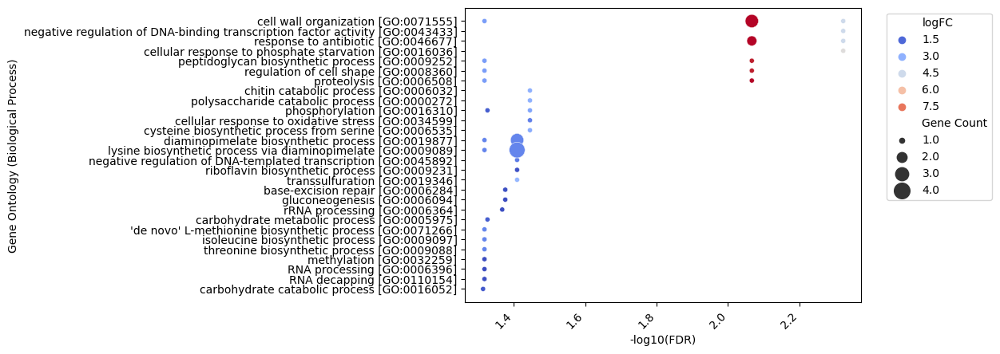

In [112]:
# Create the scatter plot for 'Gene Ontology (biological process)'
sns.scatterplot(
    data=expanded_vre0008_up_DE_GO_bp_final,
    x='-log10(FDR)',
    y='Gene Ontology (biological process)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200),  # Adjust dot sizes for better visualization
    palette='coolwarm'
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
# plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Biological Process)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
# plt.savefig('vre0008_up_DE_GO_bp_14Jan2025.svg', format="svg", bbox_inches='tight')
# plt.savefig('/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/vre0008_up_DE_GO_bp_5May2025.svg', format="svg", bbox_inches='tight')
plt.savefig('/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/vre0008_up_DE_GO_bp_5May2025.png', format="png", dpi=200, bbox_inches='tight')
plt.show()

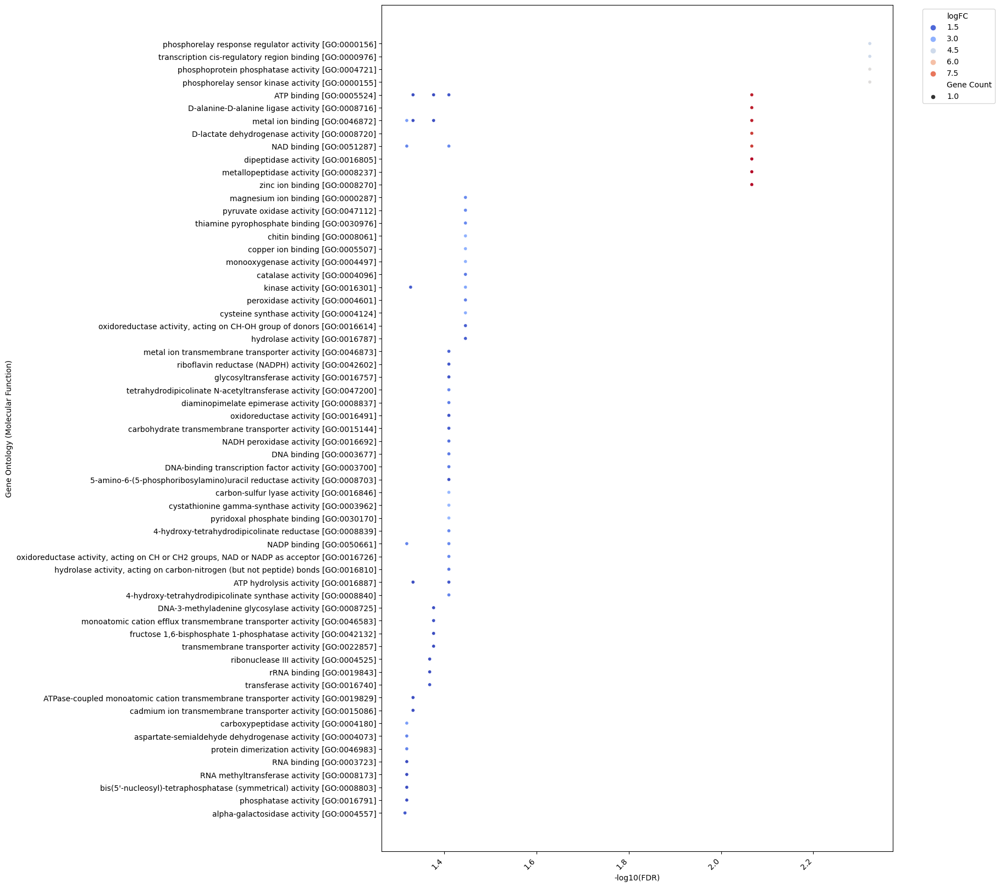

In [25]:
# Create the scatter plot for 'Gene Ontology (molecular function)'
# MO wasn't included in the final thesis

# Set figure size
plt.figure(figsize=(12, 20))  # Width x Height in inches

sns.scatterplot(
    data=expanded_vre0008_up_DE_GO_mf_final,
    x='-log10(FDR)',
    y='Gene Ontology (molecular function)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200),  # Adjust dot sizes for better visualization
    palette='coolwarm'
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Molecular Function)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.savefig('vre0008_up_DE_GO_mf_14Jan2025.svg', format="svg", bbox_inches='tight')
plt.show()
plt.show()

___VRE0008 downregulated___

In [28]:
vre0008_down_DE_GO = pd.merge(vre0008_down_df, vre0008_downregulated_GO_final, on='Gene', how='left')
vre0008_down_DE_GO['Gene Ontology (GO)'] = vre0008_down_DE_GO['Gene Ontology (GO)'].str.split(';')
vre0008_down_DE_GO['Gene Ontology (biological process)'] = vre0008_down_DE_GO['Gene Ontology (biological process)'].str.split(';')
vre0008_down_DE_GO['Gene Ontology (molecular function)'] = vre0008_down_DE_GO['Gene Ontology (molecular function)'].str.split(';')
# Transform FDR to -log10(FDR) for better visualization
vre0008_down_DE_GO['-log10(FDR)'] = -np.log10(vre0008_down_DE_GO['FDR'])

vre0008_down_DE_GO_total_genes = vre0008_down_DE_GO['Gene'].nunique()
print(f"Total number of genes: {vre0008_down_DE_GO_total_genes}")



Total number of genes: 28


In [29]:
# Gene Ontology (biological process)

vre0008_down_DE_GO_bp = vre0008_down_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (biological process)']]
expanded_vre0008_down_DE_GO_bp = vre0008_down_DE_GO_bp.explode('Gene Ontology (biological process)', ignore_index=True)
expanded_vre0008_down_DE_GO_bp['Gene Ontology (biological process)'] = expanded_vre0008_down_DE_GO_bp['Gene Ontology (biological process)'].str.lstrip()
expanded_vre0008_down_DE_GO_bp['Total GO Count'] = expanded_vre0008_down_DE_GO_bp.groupby('Gene Ontology (biological process)')['Gene Ontology (biological process)'].transform('count')
# expanded_vre0008_down_DE_GO_bp['Gene Ratio'] = round(
#     expanded_vre0008_down_DE_GO_bp['Gene Count'] / vre0008_down_DE_GO_total_genes, 2
# )

# combination_count: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (biological process)']
expanded_vre0008_down_DE_GO_bp_combo = expanded_vre0008_down_DE_GO_bp.groupby(['-log10(FDR)', 'Gene Ontology (biological process)']).size().reset_index(name='Gene Count')
expanded_vre0008_down_DE_GO_bp_final = expanded_vre0008_down_DE_GO_bp.merge(expanded_vre0008_down_DE_GO_bp_combo, on=['-log10(FDR)', 'Gene Ontology (biological process)'], how='left') 
# expanded_vre0008_down_DE_GO_bp_final['Gene Ratio'] =  round(expanded_vre0008_down_DE_GO_bp_final['combination_count'] / vre0008_down_DE_GO_total_genes,2)
expanded_vre0008_down_DE_GO_bp_final

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,Cysteine protease staphopain A,-2.082958,10.666942,104.030051,0.000118,1.445754,NaN,NaN,NaN
1,Endonuclease/exonuclease/phosphatase,-3.122321,6.704948,91.817938,0.000161,1.445754,NaN,NaN,NaN
2,Maltose phosphorylase,-4.160614,8.731035,82.771392,0.000209,1.445754,carbohydrate metabolic process [GO:0005975],4.0,2.0
3,beta-phosphoglucomutase,-4.005024,7.809746,74.863025,0.000268,1.445754,carbohydrate metabolic process [GO:0005975],4.0,2.0
4,Cyclic lactone autoinducer peptide,-1.329696,6.993976,73.464317,0.000280,1.445754,NaN,NaN,NaN
5,"Oligo-1,6-glucosidase",-2.492515,6.629114,61.453705,0.000435,1.409735,oligosaccharide catabolic process [GO:0009313],1.0,1.0
6,Orotate phosphoribosyltransferase,-1.554956,6.032850,56.658668,0.000530,1.409735,'de novo' UMP biosynthetic process [GO:0044205],1.0,1.0
7,Orotate phosphoribosyltransferase,-1.554956,6.032850,56.658668,0.000530,1.409735,pyrimidine nucleobase biosynthetic process [GO...,1.0,1.0
8,PTS glucose/maltose transporter subunit IIBCA,-3.688324,9.284063,55.637423,0.000554,1.409735,phosphoenolpyruvate-dependent sugar phosphotra...,1.0,1.0
9,PTS glucose/maltose transporter subunit IIBCA,-3.688324,9.284063,55.637423,0.000554,1.409735,phosphorylation [GO:0016310],3.0,1.0


In [960]:
# Gene Ontology (molecular function)

vre0008_down_DE_GO_mf = vre0008_down_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (molecular function)']]
expanded_vre0008_down_DE_GO_mf = vre0008_down_DE_GO_mf.explode('Gene Ontology (molecular function)', ignore_index=True)
expanded_vre0008_down_DE_GO_mf['Gene Ontology (molecular function)'] = expanded_vre0008_down_DE_GO_mf['Gene Ontology (molecular function)'].str.lstrip()
expanded_vre0008_down_DE_GO_mf['Total GO Count'] = expanded_vre0008_down_DE_GO_mf.groupby('Gene Ontology (molecular function)')['Gene Ontology (molecular function)'].transform('count')
# expanded_vre0008_down_DE_GO_mf['Gene Ratio'] = round(
#     expanded_vre0008_down_DE_GO_mf['Gene Count'] / vre0008_down_DE_GO_total_genes, 2
# )

# combination_count: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (biological process)']
expanded_vre0008_down_DE_GO_mf_combo = expanded_vre0008_down_DE_GO_mf.groupby(['-log10(FDR)', 'Gene Ontology (molecular function)']).size().reset_index(name='Gene Count')
expanded_vre0008_down_DE_GO_mf_final = expanded_vre0008_down_DE_GO_mf.merge(expanded_vre0008_down_DE_GO_mf_combo, on=['-log10(FDR)', 'Gene Ontology (molecular function)'], how='left') 
# expanded_vre0008_down_DE_GO_mf_final['Gene Ratio'] =  round(expanded_vre0008_down_DE_GO_mf_final['combination_count'] / vre0008_down_DE_GO_total_genes,2)
expanded_vre0008_down_DE_GO_mf_final

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (molecular function),Total GO Count,Gene Count
0,Cysteine protease staphopain A,-2.082958,10.666942,104.030051,0.000118,1.445754,NaN,NaN,NaN
1,Endonuclease/exonuclease/phosphatase,-3.122321,6.704948,91.817938,0.000161,1.445754,hydrolase activity [GO:0016787],2.0,1.0
2,Maltose phosphorylase,-4.160614,8.731035,82.771392,0.000209,1.445754,carbohydrate binding [GO:0030246],1.0,1.0
3,Maltose phosphorylase,-4.160614,8.731035,82.771392,0.000209,1.445754,"hydrolase activity, hydrolyzing O-glycosyl com...",2.0,1.0
4,Maltose phosphorylase,-4.160614,8.731035,82.771392,0.000209,1.445754,kojibiose phosphorylase activity [GO:0033831],1.0,1.0
5,beta-phosphoglucomutase,-4.005024,7.809746,74.863025,0.000268,1.445754,beta-phosphoglucomutase activity [GO:0008801],1.0,1.0
6,beta-phosphoglucomutase,-4.005024,7.809746,74.863025,0.000268,1.445754,magnesium ion binding [GO:0000287],2.0,1.0
7,Cyclic lactone autoinducer peptide,-1.329696,6.993976,73.464317,0.000280,1.445754,NaN,NaN,NaN
8,"Oligo-1,6-glucosidase",-2.492515,6.629114,61.453705,0.000435,1.409735,alpha-amylase activity [GO:0004556],1.0,1.0
9,Orotate phosphoribosyltransferase,-1.554956,6.032850,56.658668,0.000530,1.409735,magnesium ion binding [GO:0000287],2.0,1.0


In [961]:
expanded_vre0008_down_DE_GO_bp_final.to_csv('./GO_final_dfs/expanded_vre0008_down_DE_GO_bp_14Jan2025.tsv', sep='\t', index=None)
expanded_vre0008_down_DE_GO_mf_final.to_csv('./GO_final_dfs/expanded_vre0008_down_DE_GO_mf_14Jan2025.tsv', sep='\t', index=None)

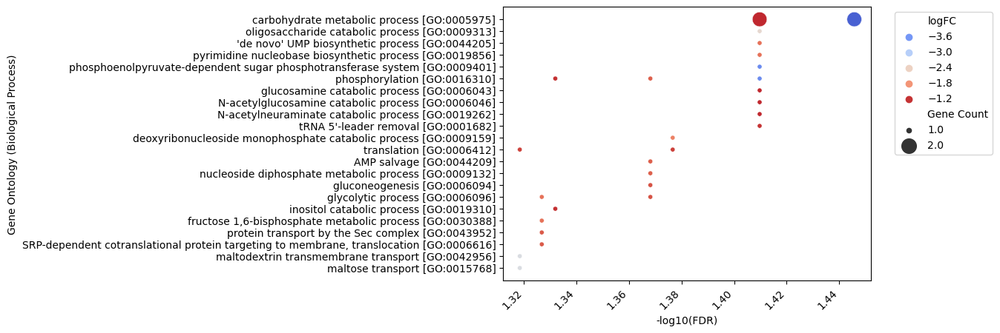

In [111]:
# Create the scatter plot
sns.scatterplot(
    data=expanded_vre0008_down_DE_GO_bp_final,
    x='-log10(FDR)',
    y='Gene Ontology (biological process)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200),  # Adjust dot sizes for better visualization
    palette='coolwarm'
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Biological Process)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
# plt.savefig('vre0008_down_DE_GO_bp_14Jan2025.svg', format="svg", bbox_inches='tight')
# plt.savefig('/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/vre0008_down_DE_GO_bp_5May2025.svg', format="svg", bbox_inches='tight')
plt.savefig('/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/vre0008_down_DE_GO_bp_5May2025.png', format="png", dpi=200, bbox_inches='tight')
plt.show()

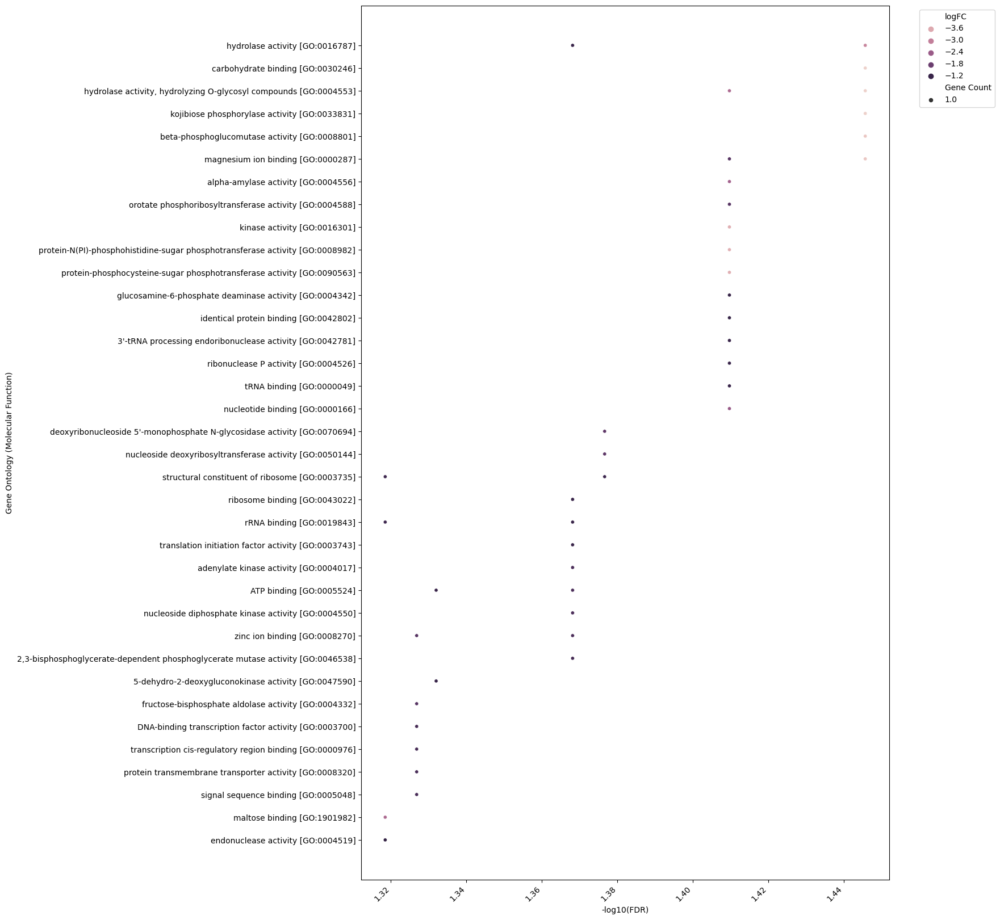

In [963]:
# Create the scatter plot

# Set figure size
plt.figure(figsize=(12, 20))  # Width x Height in inches

sns.scatterplot(
    data=expanded_vre0008_down_DE_GO_mf_final,
    x='-log10(FDR)',
    y='Gene Ontology (molecular function)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200)  # Adjust dot sizes for better visualization
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Molecular Function)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.savefig('vre0008_down_DE_GO_mf_14Jan2025.svg', format="svg", bbox_inches='tight')
plt.show()

---

___Ent0189 Upregulation___

In [33]:
ent0189_up_df = ent0189_qlft_df[(ent0189_qlft_df['logFC']>=1) & (ent0189_qlft_df['FDR']<=0.05)]
ent0189_down_df = ent0189_qlft_df[(ent0189_qlft_df['logFC']<=-1) & (ent0189_qlft_df['FDR']<=0.05)]

ent0189_upregulated_GO_final= pd.read_csv('ent0189_upregulated_GO_final_29Dec2024.tsv', sep='\t').rename(columns={'Name':'Gene'})
ent0189_downregulated_GO_final= pd.read_csv('ent0189_downregulated_GO_final_29Dec2024.tsv', sep='\t').rename(columns={'Name':'Gene'})

In [965]:
ent0189_up_DE_GO.columns

Index(['Gene', 'logFC', 'logCPM', 'F', 'PValue', 'FDR', 'Feature_Type',
       'Feature_ID', 'SourceCol', 'Entry', 'From', 'Reviewed', 'Entry Name',
       'Protein names', 'Gene Names', 'Organism', 'Length',
       'Gene Ontology (biological process)', 'Gene Ontology (GO)',
       'Gene Ontology IDs', 'Gene Ontology (molecular function)',
       'Gene Ontology (cellular component)', '-log10(FDR)'],
      dtype='object')

In [34]:
ent0189_up_DE_GO = pd.merge(ent0189_up_df, ent0189_upregulated_GO_final, on='Gene', how='left')
ent0189_up_DE_GO_total_genes = ent0189_up_DE_GO['Gene'].nunique()
print(f"Total number of genes: {ent0189_up_DE_GO_total_genes}")

ent0189_up_DE_GO['Gene Ontology (GO)'] = ent0189_up_DE_GO['Gene Ontology (GO)'].str.split(';')
ent0189_up_DE_GO['Gene Ontology (biological process)'] = ent0189_up_DE_GO['Gene Ontology (biological process)'].str.split(';')
ent0189_up_DE_GO['Gene Ontology (molecular function)'] = ent0189_up_DE_GO['Gene Ontology (molecular function)'].str.split(';')
ent0189_up_DE_GO['-log10(FDR)'] = -np.log10(ent0189_up_DE_GO['FDR'])

### GO (biological process) ####################################################################################
ent0189_up_DE_GO_bp = ent0189_up_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (biological process)']]
expanded_ent0189_up_DE_GO_bp = ent0189_up_DE_GO_bp.explode('Gene Ontology (biological process)', ignore_index=True)
expanded_ent0189_up_DE_GO_bp['Gene Ontology (biological process)'] = expanded_ent0189_up_DE_GO_bp['Gene Ontology (biological process)'].str.lstrip()
expanded_ent0189_up_DE_GO_bp['Total GO Count'] = expanded_ent0189_up_DE_GO_bp.groupby('Gene Ontology (biological process)')['Gene Ontology (biological process)'].transform('count')

# ['Gene Count']: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (biological process)']
expanded_ent0189_up_DE_GO_bp_combo = expanded_ent0189_up_DE_GO_bp.groupby(['-log10(FDR)', 'Gene Ontology (biological process)']).size().reset_index(name='Gene Count')
expanded_ent0189_up_DE_GO_bp_final = expanded_ent0189_up_DE_GO_bp.merge(expanded_ent0189_up_DE_GO_bp_combo, on=['-log10(FDR)', 'Gene Ontology (biological process)'], how='left') 
# expanded_ent0189_up_DE_GO_bp_final['Gene Ratio'] =  round(expanded_ent0189_up_DE_GO_bp_final['combination_count'] / ent0189_up_DE_GO_total_genes,3)
display(expanded_ent0189_up_DE_GO_bp_final)

### GO (molecular function) ####################################################################################\
ent0189_up_DE_GO_mf = ent0189_up_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (molecular function)']]
expanded_ent0189_up_DE_GO_mf = ent0189_up_DE_GO_mf.explode('Gene Ontology (molecular function)', ignore_index=True)
expanded_ent0189_up_DE_GO_mf['Gene Ontology (molecular function)'] = expanded_ent0189_up_DE_GO_mf['Gene Ontology (molecular function)'].str.lstrip()
expanded_ent0189_up_DE_GO_mf['Total GO Count'] = expanded_ent0189_up_DE_GO_mf.groupby('Gene Ontology (molecular function)')['Gene Ontology (molecular function)'].transform('count')

# ['Gene Count']: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (biological process)']
expanded_ent0189_up_DE_GO_mf_combo = expanded_ent0189_up_DE_GO_mf.groupby(['-log10(FDR)', 'Gene Ontology (molecular function)']).size().reset_index(name='Gene Count')
expanded_ent0189_up_DE_GO_mf_final = expanded_ent0189_up_DE_GO_mf.merge(expanded_ent0189_up_DE_GO_mf_combo, on=['-log10(FDR)', 'Gene Ontology (molecular function)'], how='left') 
# expanded_ent0189_up_DE_GO_mf_final['Gene Ratio'] = round(expanded_ent0189_up_DE_GO_mf_final['combination_count'] / ent0189_up_DE_GO_total_genes,3)
expanded_ent0189_up_DE_GO_mf_final

Total number of genes: 326


,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,NAD(P)-dependent dehydrogenase,5.182869,9.664361,835.039511,7.000469e-08,4.158428,NaN,NaN,NaN
1,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,proton transmembrane transport [GO:1902600],2.0,1.0
2,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,response to antibiotic [GO:0046677],3.0,1.0
3,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,response to antibiotic [GO:0046677],3.0,1.0
4,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,ribosome disassembly [GO:0032790],1.0,1.0
...,...,...,...,...,...,...,...,...,...
394,Calcium-transporting ATPase 1,1.418415,6.854901,11.031135,1.508474e-02,1.514900,phosphorylation [GO:0016310],14.0,1.0
395,Transcriptional regulatory protein,1.001412,4.283761,10.717710,1.603004e-02,1.496517,NaN,NaN,NaN
396,competence type IV pilus minor pilin ComGG,1.006395,-0.452876,10.285570,1.747076e-02,1.468339,NaN,NaN,NaN
397,DUF2794 domain-containing protein,1.097784,1.788022,9.932438,1.877088e-02,1.447146,NaN,NaN,NaN


,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (molecular function),Total GO Count,Gene Count
0,NAD(P)-dependent dehydrogenase,5.182869,9.664361,835.039511,7.000469e-08,4.158428,"oxidoreductase activity, acting on CH-OH group...",1.0,1.0
1,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,antiporter activity [GO:0015297],2.0,1.0
2,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,GTP binding [GO:0005525],1.0,1.0
3,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,GTPase activity [GO:0003924],1.0,1.0
4,beta-galactosidase,3.888187,10.187126,548.640501,2.567426e-07,4.071496,beta-galactosidase activity [GO:0004565],1.0,1.0
...,...,...,...,...,...,...,...,...,...
467,Transcriptional regulatory protein,1.001412,4.283761,10.717710,1.603004e-02,1.496517,phosphorelay response regulator activity [GO:0...,3.0,1.0
468,Transcriptional regulatory protein,1.001412,4.283761,10.717710,1.603004e-02,1.496517,transferase activity [GO:0016740],4.0,1.0
469,competence type IV pilus minor pilin ComGG,1.006395,-0.452876,10.285570,1.747076e-02,1.468339,NaN,NaN,NaN
470,DUF2794 domain-containing protein,1.097784,1.788022,9.932438,1.877088e-02,1.447146,NaN,NaN,NaN


In [967]:
expanded_ent0189_up_DE_GO_mf_final.to_csv('./GO_final_dfs//expanded_ent0189_up_DE_GO_mf_14Jan2025.tsv', sep='\t', index=None)
expanded_ent0189_up_DE_GO_bp_final.to_csv('./GO_final_dfs/expanded_ent0189_up_DE_GO_bp_14Jan2025.tsv', sep='\t', index=None)

In [53]:
expanded_ent0189_up_DE_GO_bp_final[~expanded_ent0189_up_DE_GO_bp_final['Total GO Count'].isna()]

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
1,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,proton transmembrane transport [GO:1902600],2.0,1.0
2,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,response to antibiotic [GO:0046677],3.0,1.0
3,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,response to antibiotic [GO:0046677],3.0,1.0
4,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,ribosome disassembly [GO:0032790],1.0,1.0
5,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,translation [GO:0006412],3.0,1.0
...,...,...,...,...,...,...,...,...,...
389,lactaldehyde reductase,1.123598,4.741857,12.958513,1.063707e-02,1.637854,fucose catabolic process [GO:0019317],1.0,1.0
390,PTS glucose transporter subunit IIA,1.205794,0.799533,12.195816,1.215726e-02,1.588080,phosphoenolpyruvate-dependent sugar phosphotra...,18.0,1.0
392,Glycoside hydrolase 105 family protein,1.272800,2.673050,11.056023,1.501306e-02,1.516217,carbohydrate metabolic process [GO:0005975],5.0,1.0
393,Calcium-transporting ATPase 1,1.418415,6.854901,11.031135,1.508474e-02,1.514900,monoatomic ion transmembrane transport [GO:003...,1.0,1.0


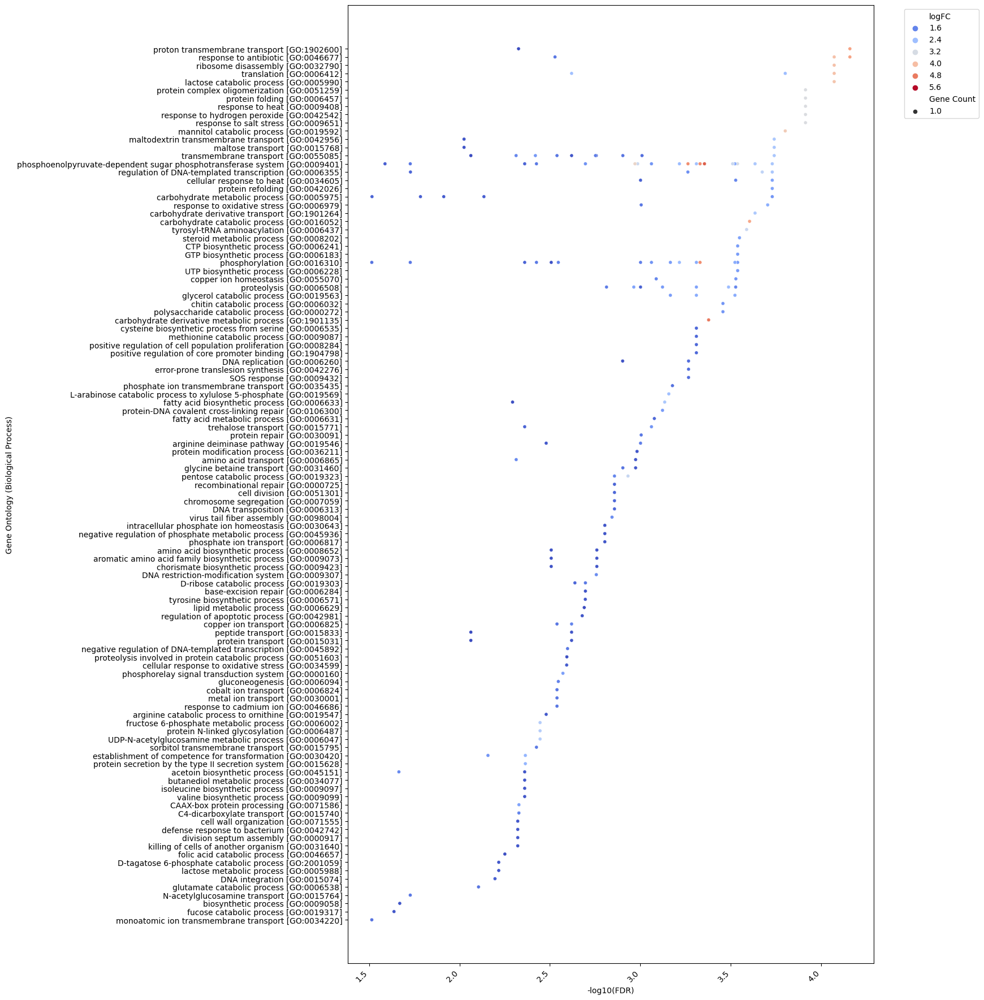

In [52]:
# Set figure size
plt.figure(figsize=(12, 22))  # Width x Height in inches

# Create the scatter plot
sns.scatterplot(
    data=expanded_ent0189_up_DE_GO_bp_final,
    x='-log10(FDR)',
    y='Gene Ontology (biological process)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200),  # Adjust dot sizes for better visualization
    palette='coolwarm'
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Biological Process)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.savefig('ent0189_up_DE_GO_bp_14Jan2025.svg', format="svg", bbox_inches='tight')
plt.show()

In [65]:
sorted_terms

,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,NAD(P)-dependent dehydrogenase,5.182869,9.664361,835.039511,7.000469e-08,4.158428,NaN,NaN,NaN
2,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,response to antibiotic [GO:0046677],3.0,1.0
1,tetracycline efflux MFS transporter Tet(L),4.379552,10.443363,833.856603,7.031286e-08,4.158428,proton transmembrane transport [GO:1902600],2.0,1.0
3,tetracycline resistance ribosomal protection p...,3.941207,10.669130,600.246722,1.944806e-07,4.071496,response to antibiotic [GO:0046677],3.0,1.0
7,Glycosyltransferase family 8 protein,3.919615,8.057057,546.264303,2.602071e-07,4.071496,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
394,Calcium-transporting ATPase 1,1.418415,6.854901,11.031135,1.508474e-02,1.514900,phosphorylation [GO:0016310],14.0,1.0
395,Transcriptional regulatory protein,1.001412,4.283761,10.717710,1.603004e-02,1.496517,NaN,NaN,NaN
396,competence type IV pilus minor pilin ComGG,1.006395,-0.452876,10.285570,1.747076e-02,1.468339,NaN,NaN,NaN
397,DUF2794 domain-containing protein,1.097784,1.788022,9.932438,1.877088e-02,1.447146,NaN,NaN,NaN


---

In [127]:
def plot_go_terms(data, title, filename):
    plt.figure(figsize=(20,20))  # Adjust as needed

    sns.scatterplot(
        data=data,
        x='-log10(FDR)',
        y='Gene Ontology (biological process)',
        size='Gene Count',
        hue='logFC',
        sizes=(100, 800),
        palette='coolwarm'
    )

    plt.xticks(rotation=45, ha='right', fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('-log10(FDR)', fontsize=16)
    plt.ylabel('Gene Ontology (Biological Process)', fontsize=16)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, title_fontsize=12)
    plt.title(title, fontsize=16)
    plt.tight_layout()

    # Save high-res for thesis
    plt.savefig(filename, format='svg', bbox_inches='tight')
    plt.show()


In [108]:
# Sort by significance
sorted_terms = expanded_ent0189_up_DE_GO_bp_final.sort_values('-log10(FDR)', ascending=False)

# Split top 20 and next 20
top_terms = sorted_terms[sorted_terms['-log10(FDR)']>=3]
bottom_terms = sorted_terms[sorted_terms['-log10(FDR)']<3]


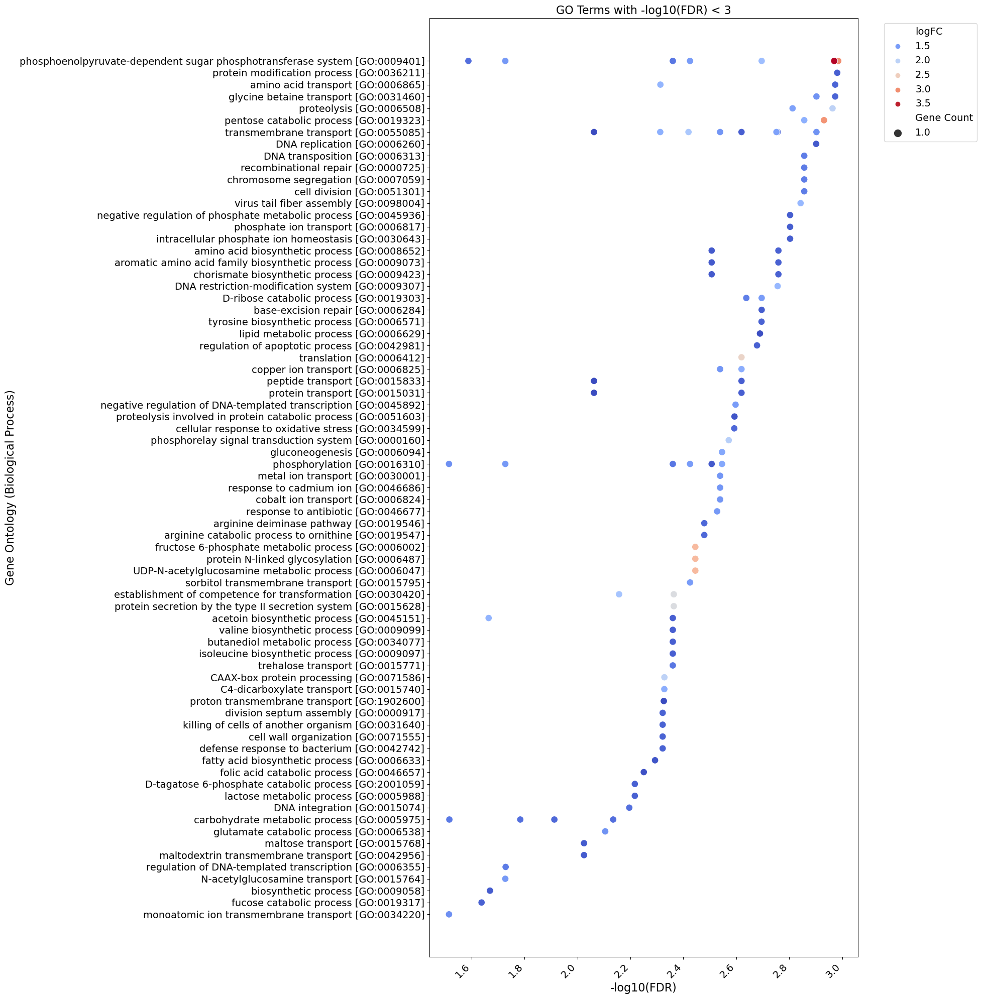

In [129]:
# plot_go_terms(top_terms, 'GO Terms with -log10(FDR) >= 3', '/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/ent0189_up_top_DE_GO_bp_5May2025.svg')
plot_go_terms(bottom_terms, 'GO Terms with -log10(FDR) < 3',  '/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/ent0189_up_bottom_DE_GO_bp_5May2025.svg')


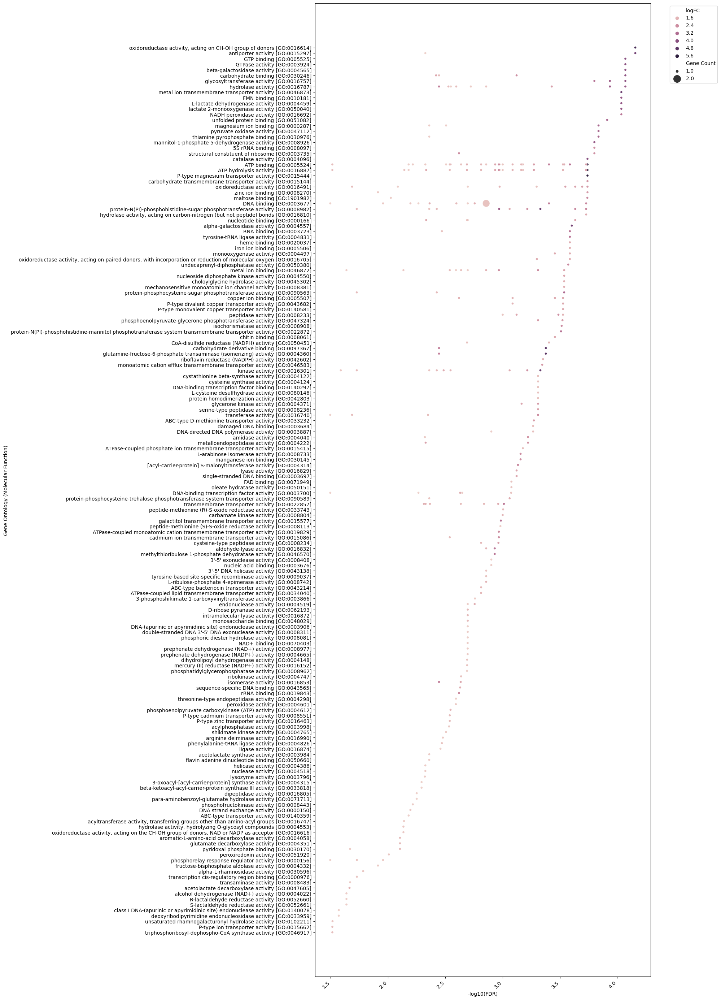

In [971]:
# Set figure size
plt.figure(figsize=(12,35))  # Width x Height in inches

# Create the scatter plot
sns.scatterplot(
    data=expanded_ent0189_up_DE_GO_mf_final,
    x='-log10(FDR)',
    y='Gene Ontology (molecular function)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200)  # Adjust dot sizes for better visualization
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Molecular Function)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.savefig('ent0189_up_DE_GO_mf_14Jan2025.svg', format="svg", bbox_inches='tight')
plt.show()

___Ent0189 Downregulation___

In [113]:
ent0189_down_DE_GO = pd.merge(ent0189_down_df, ent0189_downregulated_GO_final, on='Gene', how='left')
ent0189_down_DE_GO_total_genes = ent0189_down_DE_GO['Gene'].nunique()
print(f"Total number of genes: {ent0189_down_DE_GO_total_genes}")

ent0189_down_DE_GO['Gene Ontology (GO)'] = ent0189_down_DE_GO['Gene Ontology (GO)'].str.split(';')
ent0189_down_DE_GO['Gene Ontology (biological process)'] = ent0189_down_DE_GO['Gene Ontology (biological process)'].str.split(';')
ent0189_down_DE_GO['Gene Ontology (molecular function)'] = ent0189_down_DE_GO['Gene Ontology (molecular function)'].str.split(';')
ent0189_down_DE_GO['-log10(FDR)'] = -np.log10(ent0189_down_DE_GO['FDR'])

### GO (biological process) ####################################################################################
ent0189_down_DE_GO_bp = ent0189_down_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (biological process)']]
expanded_ent0189_down_DE_GO_bp = ent0189_down_DE_GO_bp.explode('Gene Ontology (biological process)', ignore_index=True)
expanded_ent0189_down_DE_GO_bp['Gene Ontology (biological process)'] = expanded_ent0189_down_DE_GO_bp['Gene Ontology (biological process)'].str.lstrip()
expanded_ent0189_down_DE_GO_bp['Total GO Count'] = expanded_ent0189_down_DE_GO_bp.groupby('Gene Ontology (biological process)')['Gene Ontology (biological process)'].transform('count')
# ['Gene Count']: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (molecular function)']
expanded_ent0189_down_DE_GO_bp_combo = expanded_ent0189_down_DE_GO_bp.groupby(['-log10(FDR)', 'Gene Ontology (biological process)']).size().reset_index(name='Gene Count')
expanded_ent0189_down_DE_GO_bp_final = expanded_ent0189_down_DE_GO_bp.merge(expanded_ent0189_down_DE_GO_bp_combo, on=['-log10(FDR)', 'Gene Ontology (biological process)'], how='left') 
# expanded_ent0189_down_DE_GO_bp_final['Gene Ratio'] =  round(expanded_ent0189_down_DE_GO_bp_final['combination_count'] / ent0189_down_DE_GO_total_genes,3)
display(expanded_ent0189_down_DE_GO_bp_final)

### GO (molecular function) ####################################################################################\
ent0189_down_DE_GO_mf = ent0189_down_DE_GO[['Gene', 'logFC', 'logCPM', 'F', 'PValue', '-log10(FDR)', 'Gene Ontology (molecular function)']]
expanded_ent0189_down_DE_GO_mf = ent0189_down_DE_GO_mf.explode('Gene Ontology (molecular function)', ignore_index=True)
expanded_ent0189_down_DE_GO_mf['Gene Ontology (molecular function)'] = expanded_ent0189_down_DE_GO_mf['Gene Ontology (molecular function)'].str.lstrip()
expanded_ent0189_down_DE_GO_mf['Total GO Count'] = expanded_ent0189_down_DE_GO_mf.groupby('Gene Ontology (molecular function)')['Gene Ontology (molecular function)'].transform('count')
# ['Gene Count']: count the occurrences of combinations of values between the two columns ['-log10(FDR)', 'Gene Ontology (molecular function)']
expanded_ent0189_down_DE_GO_mf_combo = expanded_ent0189_down_DE_GO_mf.groupby(['-log10(FDR)', 'Gene Ontology (molecular function)']).size().reset_index(name='Gene Count')
expanded_ent0189_down_DE_GO_mf_final = expanded_ent0189_down_DE_GO_mf.merge(expanded_ent0189_down_DE_GO_mf_combo, on=['-log10(FDR)', 'Gene Ontology (molecular function)'], how='left') 
# expanded_ent0189_down_DE_GO_mf_final['Gene Ratio'] =  round(expanded_ent0189_down_DE_GO_mf_final['combination_count'] / ent0189_down_DE_GO_total_genes,3)
expanded_ent0189_down_DE_GO_mf_final


Total number of genes: 281


,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (biological process),Total GO Count,Gene Count
0,PTS fructose transporter subunit IIB,-3.864829,11.481499,381.739251,7.851855e-07,3.936348,phosphoenolpyruvate-dependent sugar phosphotra...,15.0,1.0
1,PTS fructose transporter subunit IIB,-3.864829,11.481499,381.739251,7.851855e-07,3.936348,phosphorylation [GO:0016310],18.0,1.0
2,Orotate phosphoribosyltransferase,-3.386500,8.491383,350.900386,1.017172e-06,3.912833,'de novo' UMP biosynthetic process [GO:0044205],8.0,1.0
3,Orotate phosphoribosyltransferase,-3.386500,8.491383,350.900386,1.017172e-06,3.912833,pyrimidine nucleobase biosynthetic process [GO...,2.0,1.0
4,Orotate phosphoribosyltransferase,-3.386500,8.491383,350.900386,1.017172e-06,3.912833,UMP biosynthetic process [GO:0006222],1.0,1.0
...,...,...,...,...,...,...,...,...,...
389,Cro/CI family transcriptional regulator,-1.059616,4.070395,12.773836,1.098076e-02,1.626170,NaN,NaN,NaN
390,Epoxyqueuosine reductase QueH,-1.105324,4.394010,11.684917,1.333863e-02,1.558415,queuosine biosynthetic process [GO:0008616],1.0,1.0
391,Epoxyqueuosine reductase QueH,-1.105324,4.394010,11.684917,1.333863e-02,1.558415,tRNA modification [GO:0006400],2.0,1.0
392,anaerobic ribonucleoside-triphosphate reductase,-1.012736,10.407070,10.578786,1.647423e-02,1.488929,2'-deoxyribonucleotide biosynthetic process [G...,1.0,1.0


,Gene,logFC,logCPM,F,PValue,-log10(FDR),Gene Ontology (molecular function),Total GO Count,Gene Count
0,PTS fructose transporter subunit IIB,-3.864829,11.481499,381.739251,7.851855e-07,3.936348,kinase activity [GO:0016301],13.0,1.0
1,PTS fructose transporter subunit IIB,-3.864829,11.481499,381.739251,7.851855e-07,3.936348,protein-N(PI)-phosphohistidine-sugar phosphotr...,6.0,1.0
2,Orotate phosphoribosyltransferase,-3.386500,8.491383,350.900386,1.017172e-06,3.912833,magnesium ion binding [GO:0000287],12.0,1.0
3,Orotate phosphoribosyltransferase,-3.386500,8.491383,350.900386,1.017172e-06,3.912833,orotate phosphoribosyltransferase activity [GO...,1.0,1.0
4,PTS system mannose-specific EIIAB component,-3.779286,12.635073,295.099790,1.730076e-06,3.800939,kinase activity [GO:0016301],13.0,1.0
...,...,...,...,...,...,...,...,...,...
531,Epoxyqueuosine reductase QueH,-1.105324,4.394010,11.684917,1.333863e-02,1.558415,epoxyqueuosine reductase activity [GO:0052693],1.0,1.0
532,Epoxyqueuosine reductase QueH,-1.105324,4.394010,11.684917,1.333863e-02,1.558415,metal ion binding [GO:0046872],17.0,1.0
533,anaerobic ribonucleoside-triphosphate reductase,-1.012736,10.407070,10.578786,1.647423e-02,1.488929,ATP binding [GO:0005524],43.0,1.0
534,anaerobic ribonucleoside-triphosphate reductase,-1.012736,10.407070,10.578786,1.647423e-02,1.488929,"ribonucleoside-diphosphate reductase activity,...",1.0,1.0


In [974]:
expanded_ent0189_down_DE_GO_bp_final.to_csv('./GO_final_dfs/expanded_ent0189_down_DE_GO_bp_14Jan2025.tsv', sep='\t', index=None)
expanded_ent0189_down_DE_GO_mf_final.to_csv('./GO_final_dfs/expanded_ent0189_down_DE_GO_mf_14Jan2025.tsv', sep='\t', index=None)

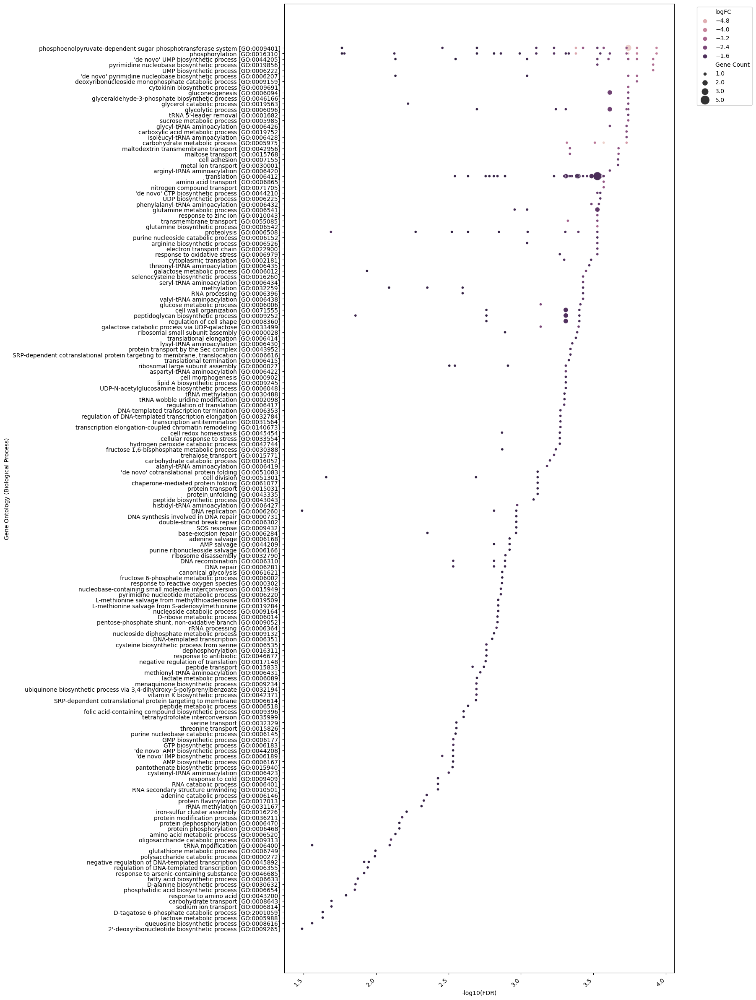

In [975]:
# Set figure size
plt.figure(figsize=(12, 30))  # Width x Height in inches

# Create the scatter plot
sns.scatterplot(
    data=expanded_ent0189_down_DE_GO_bp_final,
    x='-log10(FDR)',
    y='Gene Ontology (biological process)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200)  # Adjust dot sizes for better visualization
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Biological Process)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.savefig('ent0189_down_DE_GO_bp_14Jan2025.svg', format="svg", bbox_inches='tight')
plt.show()

In [120]:
# Sort by significance
downregulated_sorted_terms = expanded_ent0189_down_DE_GO_bp_final.sort_values('-log10(FDR)', ascending=False)

# Split top 20 and next 20
down_top_terms = downregulated_sorted_terms[downregulated_sorted_terms['-log10(FDR)']>=3]
down_bottom_terms = downregulated_sorted_terms[downregulated_sorted_terms['-log10(FDR)']<3]


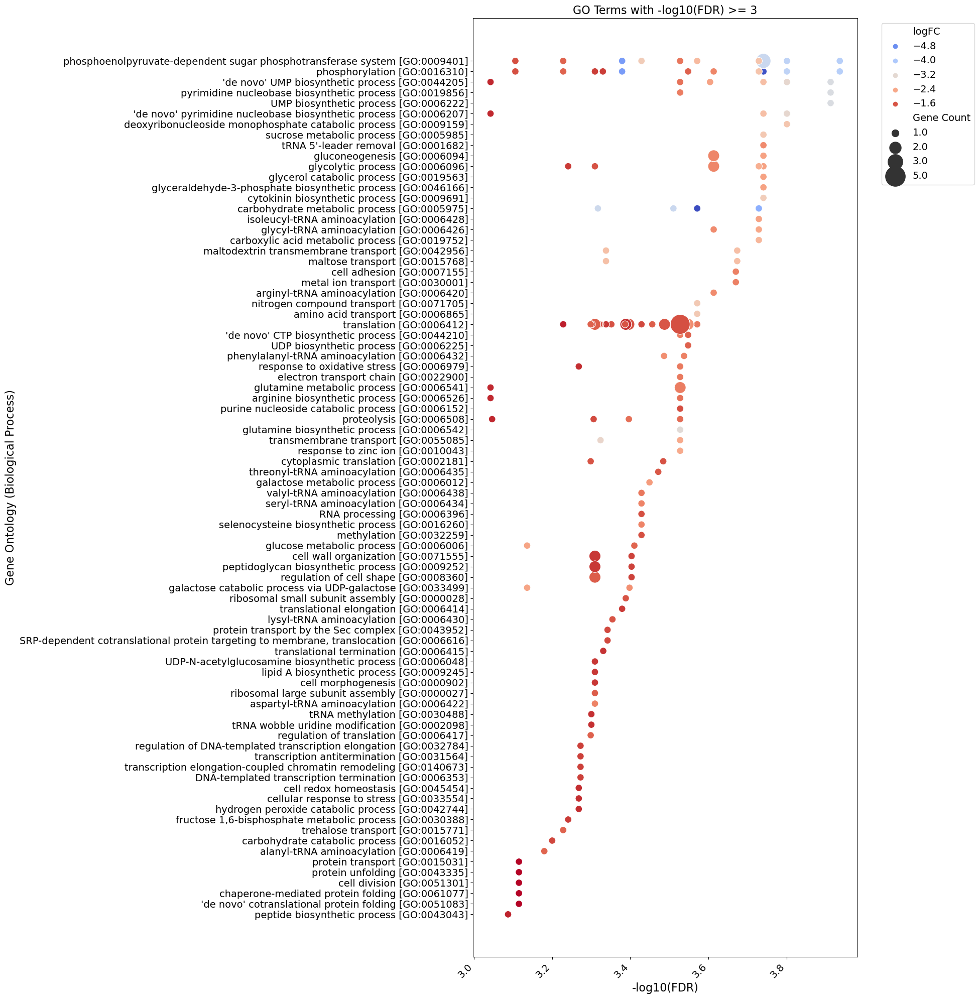

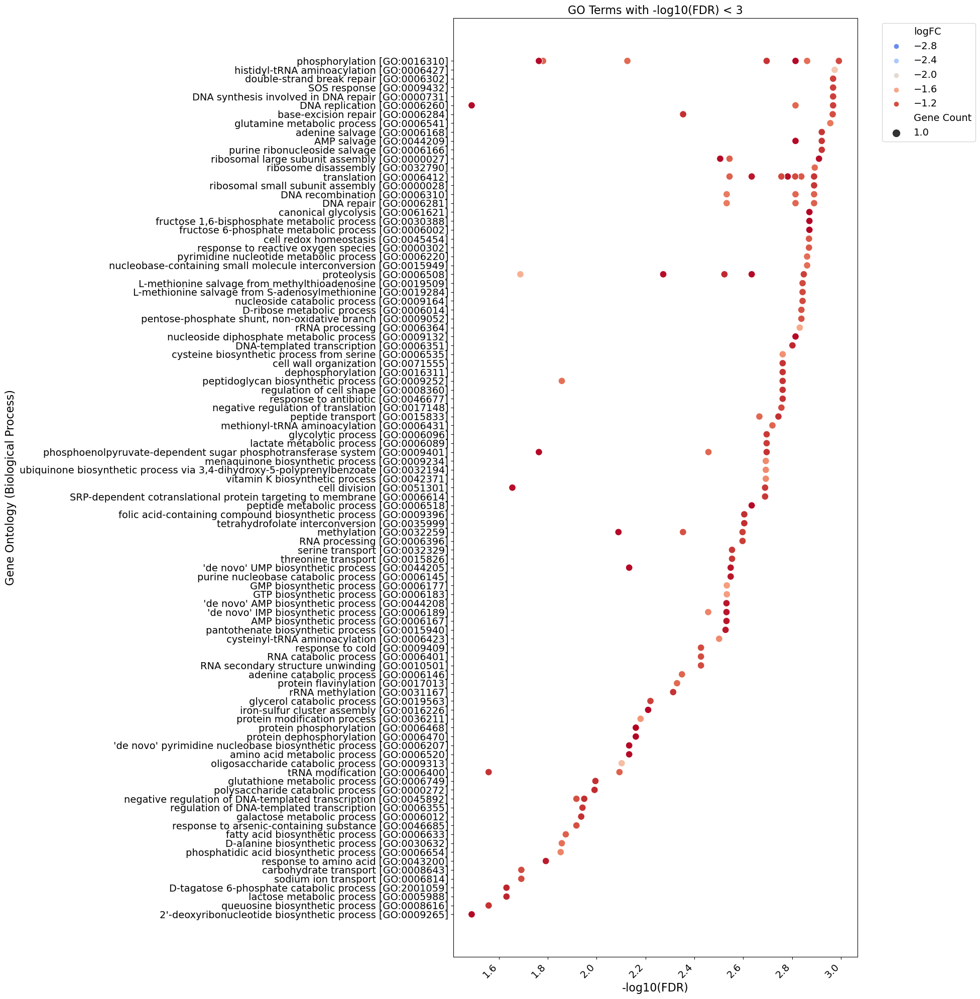

In [130]:
plot_go_terms(down_top_terms, 'GO Terms with -log10(FDR) >= 3', '/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/ent0189_down_top_DE_GO_bp_5May2025.svg')
plot_go_terms(down_bottom_terms, 'GO Terms with -log10(FDR) < 3',  '/home/jee/rna_seq/bowtie2/output_sam/final_thesis_figures/ent0189_down_bottom_DE_GO_bp_5May2025.svg')


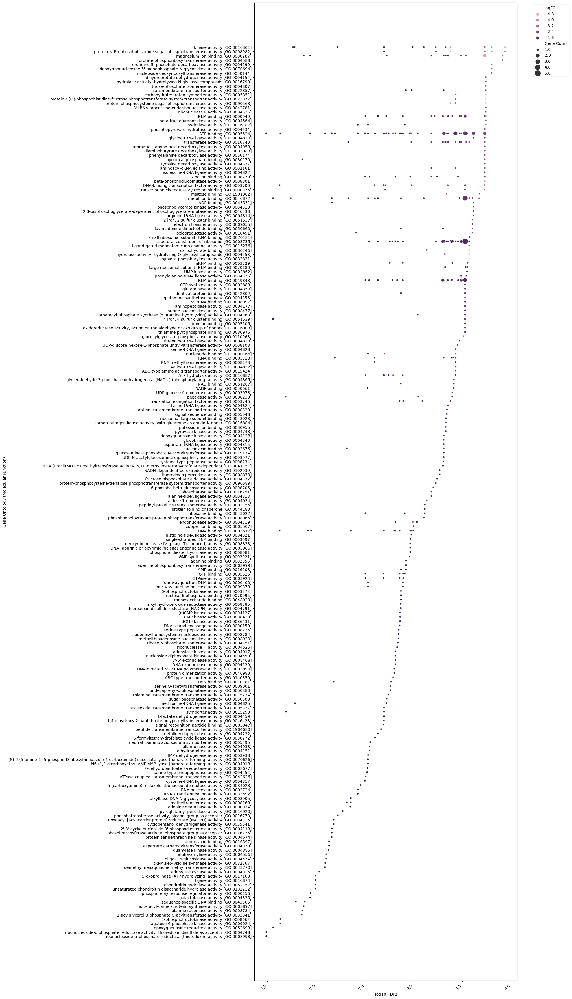

In [976]:
# Set figure size
plt.figure(figsize=(12, 45))  # Width x Height in inches

# Create the scatter plot
sns.scatterplot(
    data=expanded_ent0189_down_DE_GO_mf_final,
    x='-log10(FDR)',
    y='Gene Ontology (molecular function)',
    size='Gene Count',  # Replace with the count of genes associated with each GO term
    hue='logFC',
    sizes=(20, 200)  # Adjust dot sizes for better visualization
)

# Customize the plot
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.xlabel('-log10(FDR)')
plt.ylabel('Gene Ontology (Molecular Function)')
# plt.title('Dot Plot of Over-Represented GO Terms')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot
plt.savefig('ent0189_down_DE_GO_mf_14Jan2025.svg', format="svg", bbox_inches='tight')
plt.show()